In [2]:
import numpy as np 
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

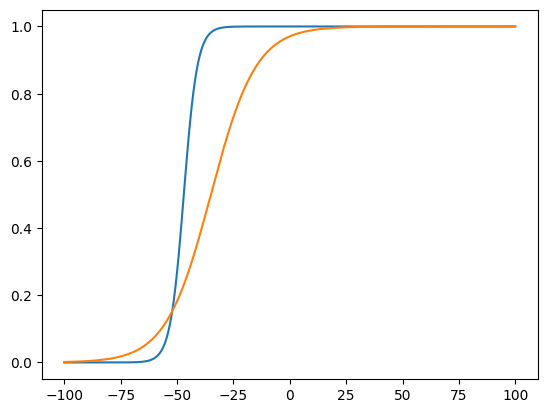

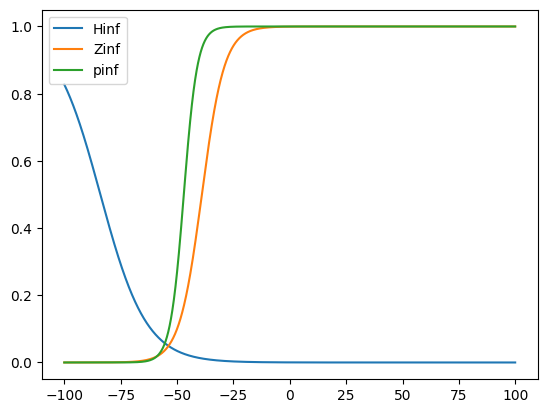

In [3]:
def pinf(V):
    return 1.0/(1+np.exp(-(V--47)/3))#can range from -47 to -41 #
def ninf(V):
    return 1.0/(1+np.exp(-(V--35)/10))
def taun(V):
    return 0.1 + 0.5*(1.0/(1+np.exp(-(V--27)/-15)))
def Zinf(V):
    return 1.0/(1+np.exp(-(V--39)/5))
def hinf(V):
    return  1.0/(1+np.exp(-(V--45)/-7))
def minf(V):
    return 1.0/(1+np.exp(-(V--30)/9.5))
def tauh(V):
    return 0.1 + 0.75*(1.0/(1+np.exp(-(V--40.5)/-6)))
def Hinf(V):
    return 1./(1. + np.exp((V + 84.)/10.2))
def tauH(V):
    return  1./(np.exp(-17.9 - 0.116*V ) + np.exp(-1.84 + 0.09*V )) + 0.1
V_range = np.arange(-100,100,.1)

plt.plot(V_range, pinf(V_range))
plt.plot(V_range, ninf(V_range))
plt.show()
plt.plot(V_range, Hinf(V_range), label = "Hinf")
plt.plot(V_range, Zinf(V_range), label = "Zinf")
plt.plot(V_range, pinf(V_range), label = "pinf")
plt.legend()




In [ ]:
# def alpha_m(V):
#     return (0.1*(V+25))/(np.exp(0.1*(V+25))-1)#(10**5)*(-V - 0.045) / (np.exp(100*(-V-0.045))-1)

# def beta_m(V):
#     return 4*np.exp(V/18)#4*10**3*np.exp((-V-0.070)/0.018)

# def minf(V):
#     return alpha_m(V) / (alpha_m(V) + beta_m(V))

# def alpha_h(V):
#     return 0.07*np.exp(V/20)#70*np.exp(50*(-V-0.07))

# def beta_h(V):
#     return 1/(1+np.exp((V+30)/10))#(10**3) / (1 + np.exp(100*(-V-0.040)))

# def hinf(V):
#     return alpha_h(V) / (alpha_h(V) + beta_h(V))

# def alpha_n(V):
#     return (0.01*(V+10))/(np.exp(0.1*(V+10))-1)#((10**4) * (-V- 0.06)) / (np.exp(100*(-V-0.06))-1)

# def beta_n(V):
#     return 0.125*np.exp((V)/80)#125 * np.exp((-V-0.07)/0.08)

# def ninf(V):
#     return alpha_n(V) / (alpha_n(V) + beta_n(V))

# V_range = np.arange(-100,20,.1)

# plt.plot(V_range, minf(V_range),label="minf")
# plt.plot(V_range, hinf(V_range),label="hinf")
# plt.plot(V_range, ninf(V_range),label="ninf")
# plt.legend()



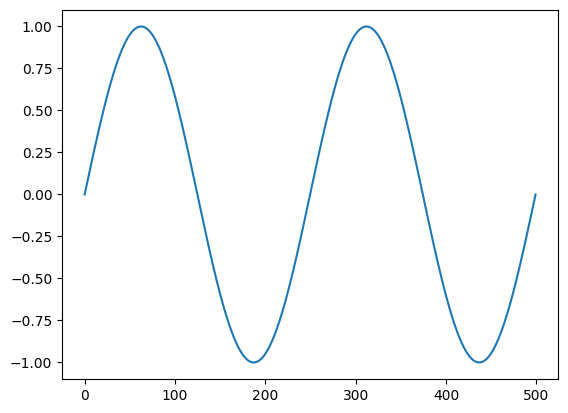

In [4]:

t = np.linspace(0, 10, 500)
omega = (2 * np.pi) / 5
Iapp = np.sin(omega * t)

plt.plot(Iapp)

In [5]:
def zap_input(i, freq, dt): return 1.5 * np.sin(2 * np.pi * freq * i * dt / 1000)
I_theta = np.array([zap_input(i, 100, dt) for i in range(N)])
plt.plot(I_theta)

NameError: name 'N' is not defined

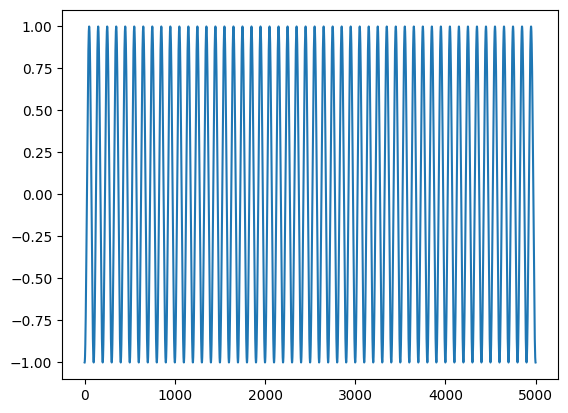

In [4]:
dt =0.1

t = np.arange(0,5000,dt)

N = len(t)
def zap_input(i, Fzap, dt):
    return np.sin(2 * np.pi * Fzap * 10**-3 * i * dt + 3 * np.pi / 2)

I_theta = np.array([zap_input(i, 10, dt) for i in range(N)]) 

plt.plot(t,I_theta)

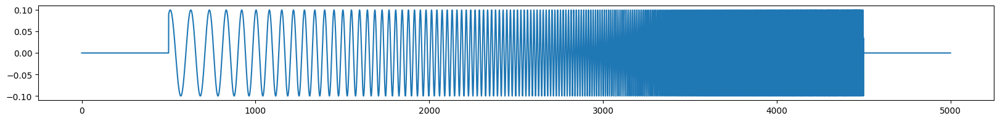

In [5]:
# def zap_log(t, f_start=0.0, f_end=100.0, amplitude=1, cycles_per_freq=1):
#     T = t[-1] - t[0]
#     k = np.log(f_end / f_start) / T
#     phase = 2 * np.pi * cycles_per_freq * f_start * (np.exp(k * t) - 1) / k
#     I_zap = amplitude * np.sin(phase)
#     freq_inst = f_start * np.exp(k * t)
#     return I_zap, freq_inst

# I_chirp, freq_inst = zap_log(t/1000.0, f_start=1, f_end=100.0, amplitude=.1, cycles_per_freq=5)

def zap_log(t, f_start=0.0, f_end=100.0, amplitude=1, cycles_per_freq=1, silence_ms=1000):
    T = t[-1] - t[0]
    k = np.log(f_end / f_start) / T
    phase = 2 * np.pi * cycles_per_freq * f_start * (np.exp(k * t) - 1) / k
    I_zap = amplitude * np.sin(phase)
    freq_inst = f_start * np.exp(k * t)
    
    # Set first and last silence_ms milliseconds to zero amplitude
    silence_s = silence_ms / 1000
    I_zap[(t <= silence_s)] = 0
    I_zap[(t >= (t[-1] - silence_s))] = 0
    
    return I_zap, freq_inst

I_chirp, freq_inst = zap_log(t/1000.0, f_start=1, f_end=100.0, amplitude=0.1, cycles_per_freq=5, silence_ms=500)

plt.figure(figsize=(20,2))
plt.plot(t, I_chirp)

plt.show()


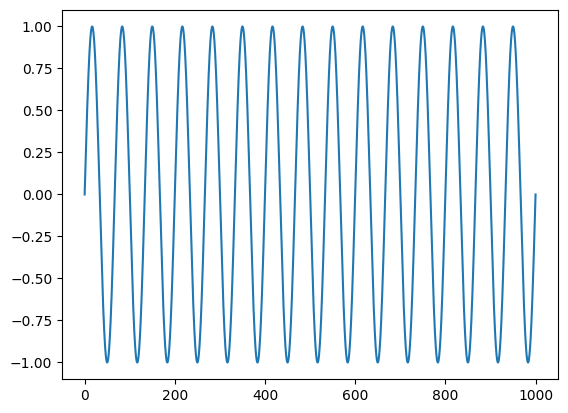

In [ ]:
f = 15
amplitude = 1
T = t[-1] - t[0]
phase = 2 * np.pi * f * t /T
I_zap = amplitude * np.sin(phase)

plt.plot(t,I_zap)


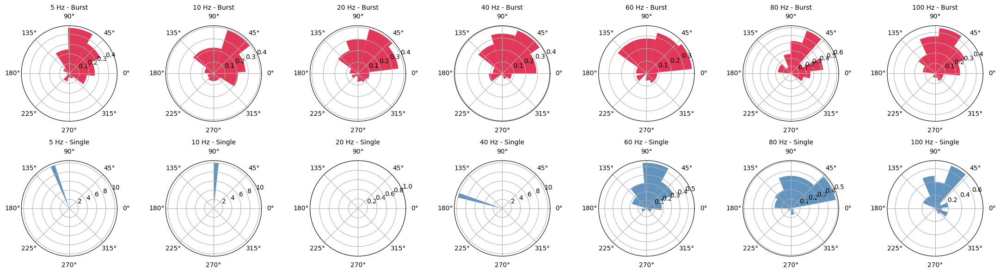

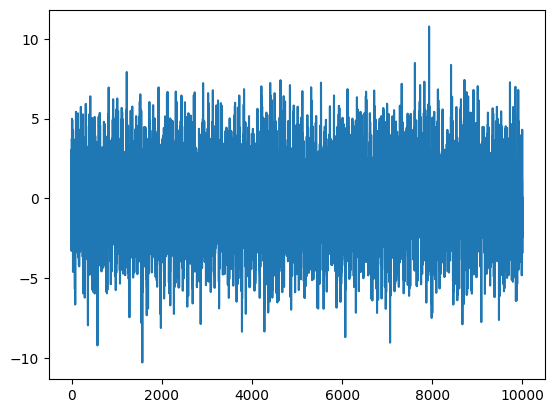

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert, find_peaks

def piecewise_constant_white_noise(t, Tdur, D, seed=None):
    if seed is not None:
        np.random.seed(seed)  # Set the random seed for reproducibility
    eta = np.random.randn(len(t))
    Ieta = np.zeros(len(t))
    for i in range(len(t)):
        Ieta[i] = eta[int(t[i] / Tdur)]
    return np.sqrt(D) * Ieta
noise = piecewise_constant_white_noise(t, .1, 5)
#def zap_input(i, freq, dt): return 1.5 * np.sin(2 * np.pi * freq * i * dt / 1000)

burst_phase_dict = {}
single_phase_dict = {}

for freq in range(1, 101):
    dt = 0.1
    t = np.arange(0, 1000, dt)
    Vs = np.zeros(len(t))
    H = np.zeros(len(t))
    Z = np.zeros(len(t))
    threshold = -58
    Gl = 0.1
    El = -58
    Ena = 55
    Ek = -90
    Eh = -32.9
    Gm = 1
    Gnap = 0
    Gh = 0
    Cm = 1
    Vs[0] = El
    I_theta = np.array([zap_input(i, freq, dt) for i in range(len(t))]) + noise

    for j in range(len(t) - 1):
        k1vs = (-Gl * (Vs[j] - El) - Gnap * pinf(Vs[j]) * (Vs[j] - Ena) - Gm * Z[j] * (Vs[j] - Ek) - Gh * H[j] * (Vs[j] - Eh) + I_theta[j]*3) / Cm
        k1Z = (Zinf(Vs[j]) - Z[j]) / 75
        k1H = (Hinf(Vs[j]) - H[j]) / tauH(Vs[j])
        avs = Vs[j] + k1vs * dt
        aZ = Z[j] + k1Z * dt
        aH = H[j] + k1H * dt
        k2vs = (-Gl * (avs - El) - Gnap * pinf(avs) * (avs - Ena) - Gh * aH * (avs - Eh) - Gm * aZ * (avs - Ek) + I_theta[j]*3) / Cm
        k2Z = (Zinf(avs) - aZ) / 75
        k2H = (Hinf(avs) - aH) / tauH(avs)
        Vs[j + 1] = Vs[j] + (k1vs + k2vs) * dt / 2
        Z[j + 1] = Z[j] + (k1Z + k2Z) * dt / 2
        H[j + 1] = H[j] + (k1H + k2H) * dt / 2
        if Vs[j] > threshold:
            Vs[j] = 20
            Vs[j + 1] = -70

    peaks, _ = find_peaks(Vs, height=0)
    spike_times = t[peaks]
    isi = np.diff(spike_times)
    burst_threshold = 10
    used_indices = set()
    i = 0
    while i < len(isi):
        if isi[i] < burst_threshold:
            used_indices.add(i)
            used_indices.add(i + 1)
            while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
                i += 1
                used_indices.add(i + 1)
        i += 1

    burst_spikes = []
    single_spikes = []
    for idx, spike_time in enumerate(spike_times):
        if idx in used_indices:
            burst_spikes.append(spike_time)
        else:
            single_spikes.append(spike_time)

    analytic_signal = hilbert(I_theta)
    inst_phase = np.angle(analytic_signal)
    burst_peaks = [i for i in peaks if t[i] in burst_spikes]
    single_peaks = [i for i in peaks if t[i] in single_spikes]
    burst_phase_dict[freq] = inst_phase[burst_peaks]
    single_phase_dict[freq] = inst_phase[single_peaks]

selected_freqs = [5, 10, 20, 40, 60, 80, 100]
fig, axes = plt.subplots(2, len(selected_freqs), subplot_kw={'projection': 'polar'}, figsize=(22, 6))

for i, freq in enumerate(selected_freqs):
    ax1 = axes[0, i]
    ax2 = axes[1, i]
    
    burst_phases = burst_phase_dict.get(freq, [])
    single_phases = single_phase_dict.get(freq, [])
    
    if len(burst_phases) > 0:
        ax1.hist(burst_phases, bins=10, density=True, color='crimson', alpha=0.85)
    ax1.set_title(f"{freq} Hz - Burst", fontsize=10)
    
    if len(single_phases) > 0:
        ax2.hist(single_phases, bins=10, density=True, color='steelblue', alpha=0.85)
    ax2.set_title(f"{freq} Hz - Single", fontsize=10)

plt.tight_layout()
plt.show()

plt.plot(I_theta)


In [23]:
nested_list = [[1, 2, 3], [4, 5], [6, 7, 8, 9]]
last_elements = [sublist[-1] for sublist in nested_list]
print(last_elements)

[3, 5, 9]


In [25]:
mylist = [1,2,3,4,5],[1,2,3]
newlist = []
print(mylist[-1])
newlist.append([end[-1] for end in mylist])
print(newlist)

[1, 2, 3]
[[5, 3]]


In [51]:
def find_bursts(isi, burst_threshold):
    """
    Detects bursts based on an inter-spike interval (ISI) threshold.

    Args:
        isi (list): A list or array of inter-spike intervals.
        burst_threshold (float): The maximum ISI to be considered part of a burst.

    Returns:
        tuple: A tuple containing:
            - burst_starts (list): The starting index of each burst.
            - spikes_per_burst (list): The number of spikes in each burst.
            - burst_spikes (list): A list of lists, where each inner list contains
                                   the indices of spikes for a single burst.
    """
    burst_starts = []
    spikes_per_burst = []
    burst_spikes = []
    i = 0

    while i < len(isi):
        if isi[i] < burst_threshold:
            # Found the start of a potential burst
            start_index = i
            current_burst_indices = [i]
            count = 1

            # Continue gathering spikes as long as the ISI is below the threshold
            while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
                i += 1
                count += 1
                current_burst_indices.append(i)

            # A burst was detected, so record the results
            burst_starts.append(start_index)
            spikes_per_burst.append(count)
            burst_spikes.append(current_burst_indices)

        i += 1

    return burst_starts, spikes_per_burst, burst_spikes

# Example usage:
# A list of inter-spike intervals (ISIs) in milliseconds
# Here, we assume a burst threshold of 50 ms.
sample_isi = [10, 15, 80, 20, 30, 45, 100, 5, 12, 18]
burst_threshold = 50

# Detect the bursts
starts, counts, indices = find_bursts(sample_isi, burst_threshold)

# Print the results
print(f"Sample ISIs: {sample_isi}\n")
print(f"Burst starts (ISI index): {starts}")
print(f"Spikes per burst: {counts}")
print(f"Spike indices per burst: {indices}")


Sample ISIs: [10, 15, 80, 20, 30, 45, 100, 5, 12, 18]

Burst starts (ISI index): [0, 3, 7]
Spikes per burst: [2, 3, 3]
Spike indices per burst: [[0, 1], [3, 4, 5], [7, 8, 9]]


[10 Hz] Total spikes: 66
[10 Hz] Total bursts detected: 9
[10 Hz] Spikes in bursts: 64
[10 Hz] Single spikes: 2
PLVu Burst [0.2588933764729072] @ freq 10 Hz
PLVu Spike [0.3030352696327734] @ freq 10 Hz


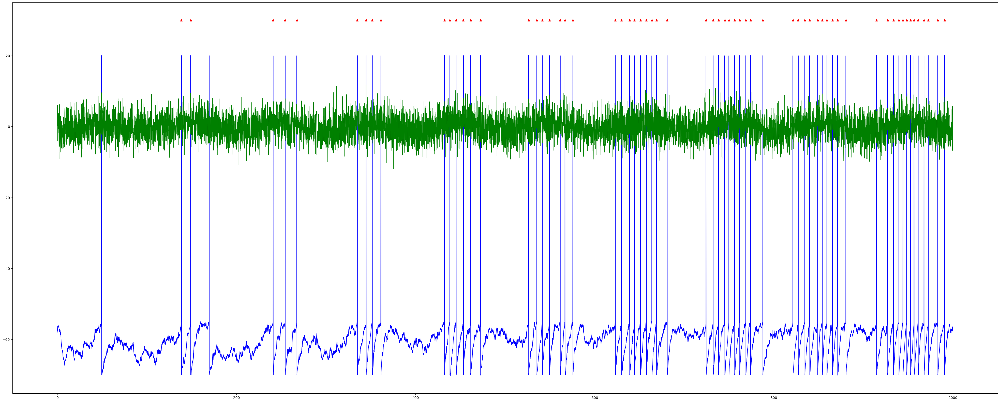

[10 Hz] Total spikes: 67
[10 Hz] Total bursts detected: 8
[10 Hz] Spikes in bursts: 65
[10 Hz] Single spikes: 2
PLVu Burst [0.2588933764729072, 0.21218125378303102] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0] @ freq 10 Hz


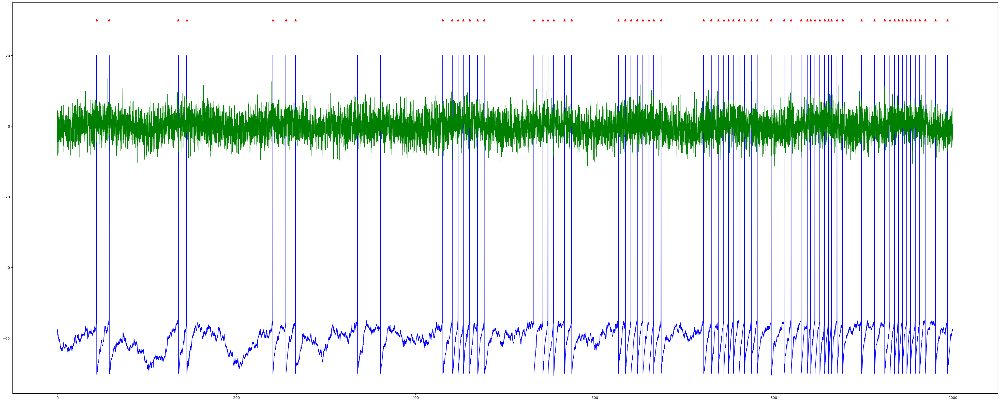

[10 Hz] Total spikes: 61
[10 Hz] Total bursts detected: 8
[10 Hz] Spikes in bursts: 58
[10 Hz] Single spikes: 3
PLVu Burst [0.2588933764729072, 0.21218125378303102, 0.20984332037636133] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0, 0] @ freq 10 Hz


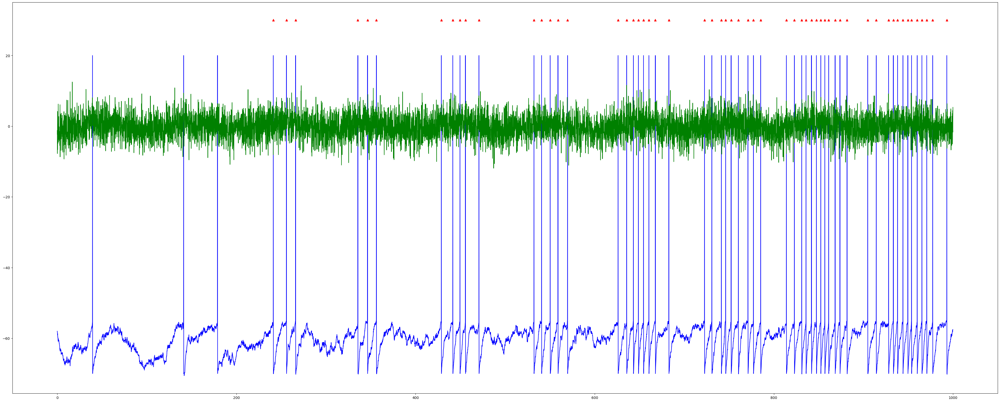

[10 Hz] Total spikes: 64
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 64
[10 Hz] Single spikes: 0
PLVu Burst [0.2588933764729072, 0.21218125378303102, 0.20984332037636133, 0.21886009215576369] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0, 0, 0] @ freq 10 Hz


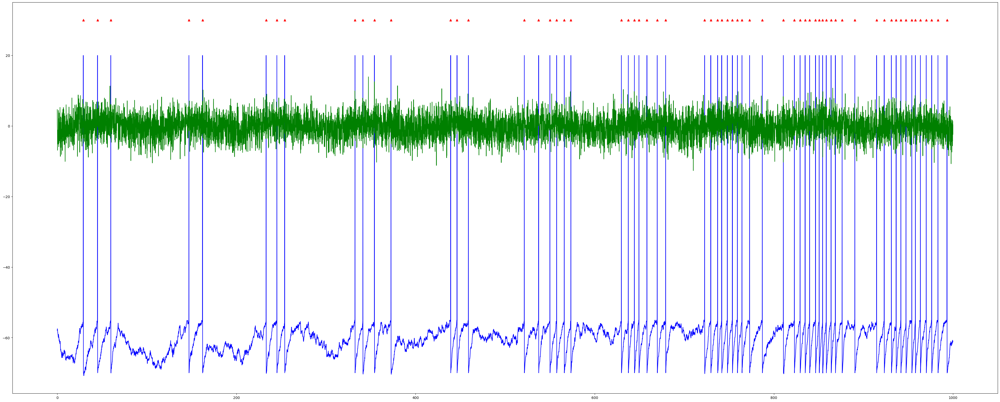

[10 Hz] Total spikes: 64
[10 Hz] Total bursts detected: 8
[10 Hz] Spikes in bursts: 64
[10 Hz] Single spikes: 0
PLVu Burst [0.2588933764729072, 0.21218125378303102, 0.20984332037636133, 0.21886009215576369, 0.20185673151206418] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0, 0, 0, 0] @ freq 10 Hz


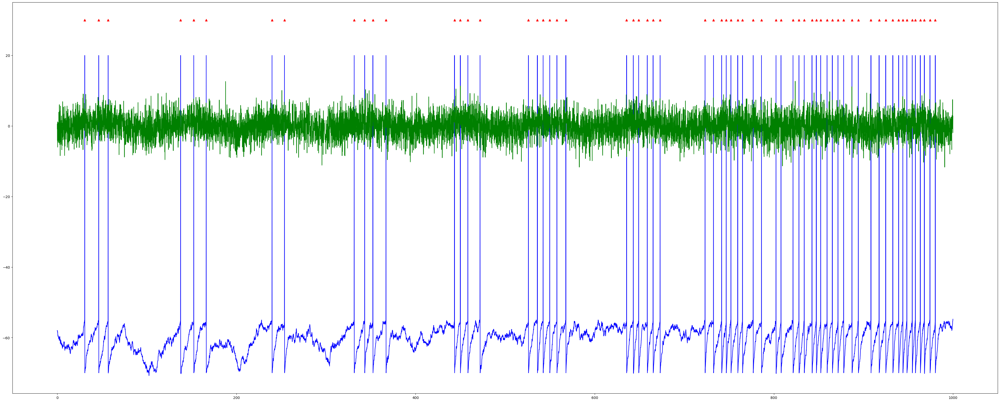

[10 Hz] Total spikes: 62
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 62
[10 Hz] Single spikes: 0
PLVu Burst [0.2588933764729072, 0.21218125378303102, 0.20984332037636133, 0.21886009215576369, 0.20185673151206418, 0.2683788892519223] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0, 0, 0, 0, 0] @ freq 10 Hz


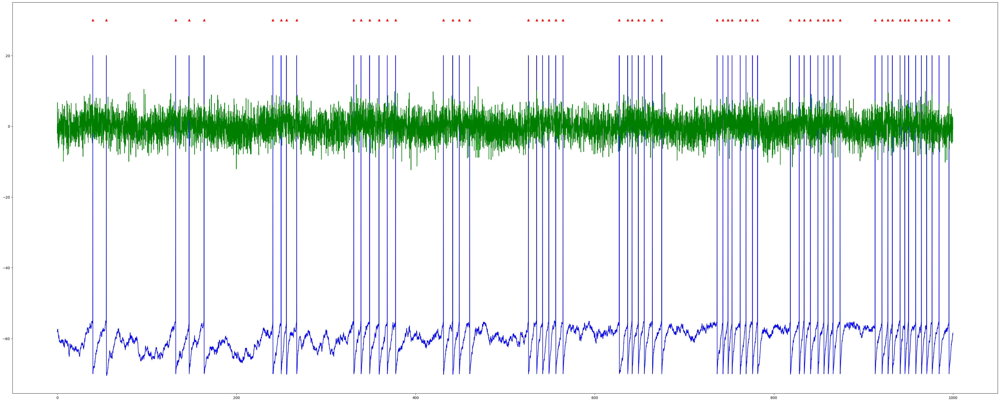

[10 Hz] Total spikes: 66
[10 Hz] Total bursts detected: 9
[10 Hz] Spikes in bursts: 64
[10 Hz] Single spikes: 2
PLVu Burst [0.2588933764729072, 0.21218125378303102, 0.20984332037636133, 0.21886009215576369, 0.20185673151206418, 0.2683788892519223, 0.2209507220867726] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0, 0, 0, 0, 0, 0.1190971600948687] @ freq 10 Hz


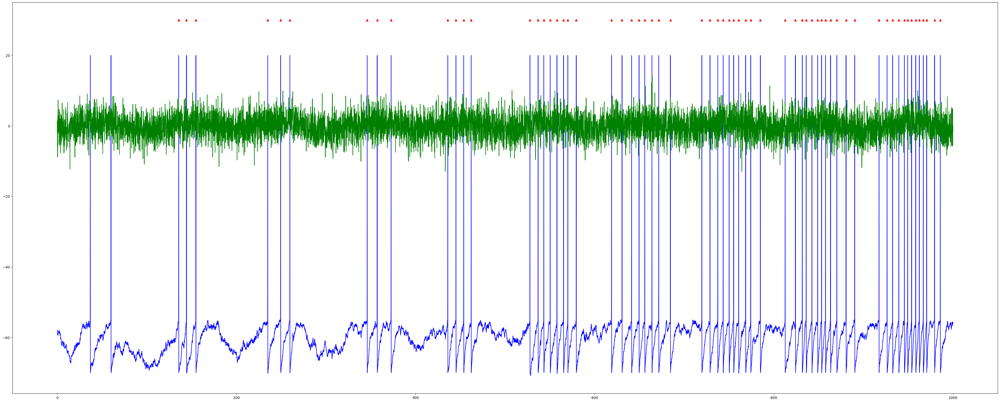

[10 Hz] Total spikes: 65
[10 Hz] Total bursts detected: 8
[10 Hz] Spikes in bursts: 64
[10 Hz] Single spikes: 1
PLVu Burst [0.2588933764729072, 0.21218125378303102, 0.20984332037636133, 0.21886009215576369, 0.20185673151206418, 0.2683788892519223, 0.2209507220867726, 0.21492019261095596] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0, 0, 0, 0, 0, 0.1190971600948687, 0] @ freq 10 Hz


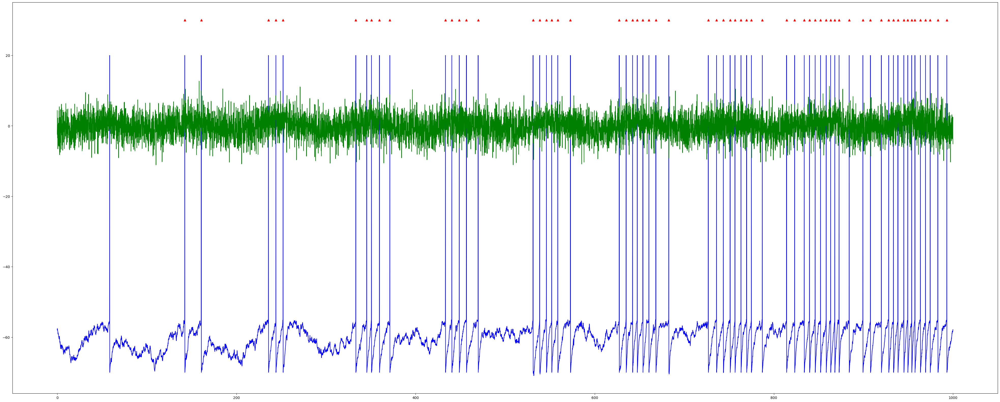

[10 Hz] Total spikes: 73
[10 Hz] Total bursts detected: 9
[10 Hz] Spikes in bursts: 73
[10 Hz] Single spikes: 0
PLVu Burst [0.2588933764729072, 0.21218125378303102, 0.20984332037636133, 0.21886009215576369, 0.20185673151206418, 0.2683788892519223, 0.2209507220867726, 0.21492019261095596, 0.22027768319266006] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0, 0, 0, 0, 0, 0.1190971600948687, 0, 0] @ freq 10 Hz


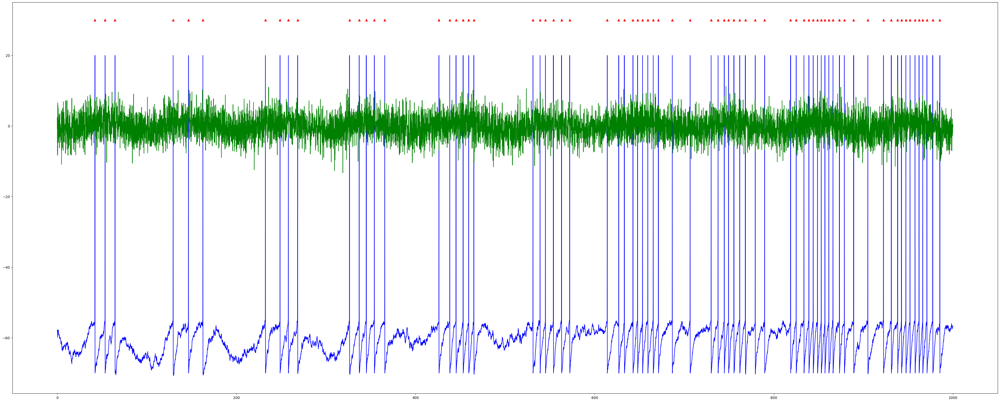

[10 Hz] Total spikes: 61
[10 Hz] Total bursts detected: 9
[10 Hz] Spikes in bursts: 59
[10 Hz] Single spikes: 2
PLVu Burst [0.2588933764729072, 0.21218125378303102, 0.20984332037636133, 0.21886009215576369, 0.20185673151206418, 0.2683788892519223, 0.2209507220867726, 0.21492019261095596, 0.22027768319266006, 0.27918533711838905] @ freq 10 Hz
PLVu Spike [0.3030352696327734, 0, 0, 0, 0, 0, 0.1190971600948687, 0, 0, 0] @ freq 10 Hz


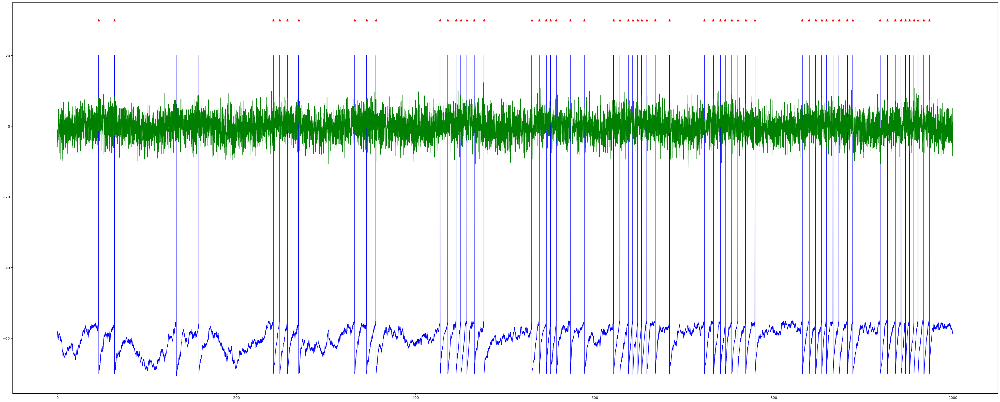

ValueError: x and y must have same first dimension, but have shapes (1,) and (10,)

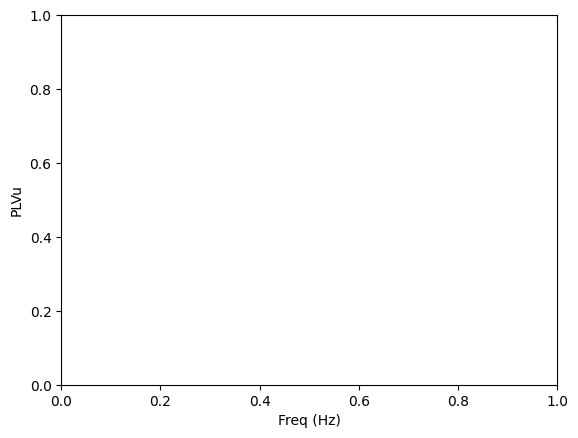

In [247]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert, find_peaks

def piecewise_constant_white_noise(t, Tdur, D, seed=None):
    if seed is not None:
        np.random.seed(seed)
    eta = np.random.randn(len(t))
    Ieta = np.zeros(len(t))
    for i in range(len(t)):
        Ieta[i] = eta[int(t[i] / Tdur)]
    return np.sqrt(D) * Ieta

def compute_plvu(phases):
    N = len(phases)
    if N < 2:
        return 0
    R = np.abs(np.sum(np.exp(1j * phases)))/N
    plvu = (N * R**2 - 1) / (N - 1)
    return max(plvu, 0)  # Ensure non-negative

dt = 0.1
t = np.arange(0, 1000, dt)
N_neurons = 10
burst_threshold = 20

freqs = np.arange(10, 11)

PLVu_theta_burst = []
PLVu_theta_single = []
PLVu_gamma_burst = []
PLVu_gamma_single = []

plvu_spike_accum = []
plvu_burst_accum = []

for freq in freqs:
    plvu_theta_burst_accum = []
    plvu_theta_single_accum = []
    plvu_gamma_burst_accum = []
    plvu_gamma_single_accum = []

    plvu_burst = []
    plvu_spike = []



    for neuron in range(N_neurons):
        noise = piecewise_constant_white_noise(t, 0.1, 10, seed=neuron)
        Vs = np.zeros(len(t))
        H = np.zeros(len(t))
        Z = np.zeros(len(t))
        h = np.zeros(len(t))
        n = np.zeros(len(t))
        threshold = -55
        Gl = 0.1
        El = -58
        Ena = 55
        Ek = -90
        Eh = -32.9
        Gm = 3
        Gnap = 0
        Gh = 3
        Cm = 1
        Gna = 0
        Gk = 0
        Vs[0] = El

        I_theta = np.array([zap_input(i, freq, dt) for i in range(len(t))])+noise

        for j in range(len(t) - 1):
            k1vs = (-Gl * (Vs[j] - El)
                - Gnap * pinf(Vs[j]) * (Vs[j] - Ena)
                - Gm * Z[j] * (Vs[j] - Ek)
                - Gh * H[j] * (Vs[j] - Eh)
                - Gna * (minf(Vs[j]) ** 3) * h[j] * (Vs[j] - Ena)
                - Gk * (n[j] ** 4) * (Vs[j] - Ek)
                + I_theta[j]) / Cm
            k1n = (ninf(Vs[j]) - n[j]) / taun(Vs[j])
            k1Z = (Zinf(Vs[j]) - Z[j]) / 75
            k1h = (hinf(Vs[j]) - h[j]) / tauh(Vs[j])
            k1H = (Hinf(Vs[j]) - H[j]) / tauH(Vs[j])
            avs = Vs[j] + k1vs * dt
            an = n[j] + k1n * dt
            aZ = Z[j] + k1Z * dt
            ah = h[j] + k1h * dt
            aH = H[j] + k1H * dt
            k2vs = (-Gl * (avs - El)
                    - Gnap * pinf(avs) * (avs - Ena)
                    - Gh * aH * (avs - Eh)
                    - Gm * aZ * (avs - Ek)
                    - Gna * (minf(avs) ** 3) * ah * (avs - Ena)
                    - Gk * (an ** 4) * (avs - Ek)
                    + I_theta[j]) / Cm
            k2n = (ninf(avs) - an) / taun(avs)
            k2Z = (Zinf(avs) - aZ) / 75
            k2h = (hinf(avs) - ah) / tauh(avs)
            k2H = (Hinf(avs) - aH) / tauH(avs)
            Vs[j + 1] = Vs[j] + (k1vs + k2vs) * dt / 2
            n[j + 1] = n[j] + (k1n + k2n) * dt / 2
            Z[j + 1] = Z[j] + (k1Z + k2Z) * dt / 2
            h[j + 1] = h[j] + (k1h + k2h) * dt / 2
            H[j + 1] = H[j] + (k1H + k2H) * dt / 2
            if Vs[j] > threshold:
                Vs[j] = 20
                Vs[j + 1] = -70

        # peaks, _ = find_peaks(Vs, height=0)
        # spike_times = t[peaks]
        # isi = np.diff(spike_times)

        # used_indices = set()
        # i = 0
        # while i < len(isi):
        #     if isi[i] < burst_threshold:
        #         used_indices.add(i)
        #         used_indices.add(i + 1)
        #         while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
        #             i += 1
        #             used_indices.add(i + 1)
        #     i += 1

        # burst_spikes = []
        # single_spikes = []
        # for idx, spike_time in enumerate(spike_times):
        #     if idx in used_indices:
        #         burst_spikes.append(spike_time)
        #     else:
        #         single_spikes.append(spike_time)

        # Spike detection
        peaks, _ = find_peaks(Vs, height=0)
        spike_times = t[peaks]
        isi = np.diff(spike_times)

        # Burst criteria
        min_spikes_in_burst = 2
        burst_isi_max = 20      # ms
        burst_end_gap = 20      # ms

        # Containers
        burst_spikes = []
        single_spikes = []
        all_bursts = []

        # Burst detection loop
        current_burst = [spike_times[0]] if len(spike_times) > 0 else []

        for i in range(1, len(spike_times)):
            interval = spike_times[i] - spike_times[i - 1]

            if interval <= burst_isi_max:
                current_burst.append(spike_times[i])
            else:
                # Check for valid burst
                if len(current_burst) >= min_spikes_in_burst:
                    # Only end burst if there's a 30ms gap after it
                    if interval >= burst_end_gap:
                        all_bursts.append(current_burst)
                        burst_spikes.extend(current_burst)
                    else:
                        # Didn't meet end-gap criteria, treat all as singles
                        single_spikes.extend(current_burst)
                else:
                    single_spikes.extend(current_burst)
                
                current_burst = [spike_times[i]]

        # Check last burst at end
        if len(current_burst) >= min_spikes_in_burst:
            all_bursts.append(current_burst)
            burst_spikes.extend(current_burst)
        else:
            single_spikes.extend(current_burst)

        # Print summaries
        print(f"[{freq} Hz] Total spikes: {len(spike_times)}")
        print(f"[{freq} Hz] Total bursts detected: {len(all_bursts)}")
        print(f"[{freq} Hz] Spikes in bursts: {len(burst_spikes)}")
        print(f"[{freq} Hz] Single spikes: {len(single_spikes)}")

        analytic_signal = hilbert(I_theta-noise)
        inst_phase = np.angle(analytic_signal)
        
        # for sb in all_bursts:
        #     first_spike_in_sb = sb[0]

        #     print(f"first spike in sb {first_spike_in_sb}")

        burst_peaks = [i for i in peaks if t[i] in burst_spikes]
        single_peaks = [i for i in peaks if t[i] in single_spikes]

        if len(spike_times) > 10:
            burst_phases = inst_phase[burst_peaks]
            plvu_burst.append(compute_plvu(burst_phases))
            plvu_burst_accum.append(compute_plvu(burst_phases))
            print(f'PLVu Burst {plvu_burst} @ freq {freq} Hz')
        
            single_phases = inst_phase[single_peaks]
            plvu_spike.append(compute_plvu(single_phases))
            plvu_spike_accum.append(compute_plvu(single_phases))
            print(f'PLVu Spike {plvu_spike} @ freq {freq} Hz')

        else:
            plvu_spike.append(0)
            plvu_spike_accum.append(0)
            print(f'PLVu Spike {plvu_spike} @ freq {freq} Hz')

            plvu_burst.append(0)
            plvu_burst_accum.append(0)
            print(f'PLVu Burst {plvu_burst} @ freq {freq} Hz')


   
        y_burst_spikes = np.zeros_like(burst_spikes)+30


        plt.figure(figsize=(50,20))
        plt.plot(t,Vs,color = "blue")
        plt.plot(t,I_theta,color = "green")
        plt.scatter(burst_spikes,y_burst_spikes, marker='^', color='red', label='Triangles')
        plt.show()

        
        #plvu_theta_burst_accum.append(compute_plvu(burst_phases))
        #plvu_theta_single_accum.append(compute_plvu(single_phases))

        # fs = 1000/dt
        # gamma_freq = 40
        # analytic_signal_gamma = hilbert(np.sin(2 * np.pi * gamma_freq * t / 1000))
        # inst_phase_gamma = np.angle(analytic_signal_gamma)

        # burst_phases_gamma = inst_phase_gamma[burst_peaks]
        # single_phases_gamma = inst_phase_gamma[single_peaks]

        # plvu_gamma_burst_accum.append(compute_plvu(burst_phases_gamma))
        # plvu_gamma_single_accum.append(compute_plvu(single_phases_gamma))

    # PLVu_theta_burst.append(np.mean(plvu_theta_burst_accum))
    # PLVu_theta_single.append(np.mean(plvu_theta_single_accum))
    # PLVu_gamma_burst.append(np.mean(plvu_gamma_burst_accum))
    # PLVu_gamma_single.append(np.mean(plvu_gamma_single_accum))

# fig, axs = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
# axs[0].plot(freqs, PLVu_theta_burst, label='Burst')
# axs[0].plot(freqs, PLVu_theta_single, label='Single')
# axs[0].set_title('Theta Band PLVu (6-10 Hz approx)')
# axs[0].set_ylabel('PLVu')
# axs[0].legend()
# axs[0].grid(True)

# axs[1].plot(freqs, PLVu_gamma_burst, label='Burst')
# axs[1].plot(freqs, PLVu_gamma_single, label='Single')
# axs[1].set_title('Gamma Band PLVu (~40 Hz reference)')
# axs[1].set_xlabel('Input Frequency (Hz)')
# axs[1].set_ylabel('PLVu')
# axs[1].legend()
# axs[1].grid(True)

# plt.tight_layout()
# plt.show()
plt.ylabel("PLVu")
plt.xlabel("Freq (Hz)")
plt.plot(freqs,plvu_spike_accum,color = 'blue',label = "single spike")
plt.plot(freqs,plvu_burst_accum, color = 'red', label = "spike burst")
plt.legend(loc = "upper right")
plt.grid()
plt.show()

plt.figure(figsize=(10, 5))
plt.semilogx(freqs, plvu_spike_accum, color='blue', label="Single Spikes")
plt.semilogx(freqs, plvu_burst_accum, color='red', label="Burst Spikes")
plt.xlabel("Input Frequency (Hz, log scale)")
plt.ylabel("PLVu")
plt.title("Phase-Locking Value (PLVu) vs Frequency")
plt.grid(True, which='both', linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


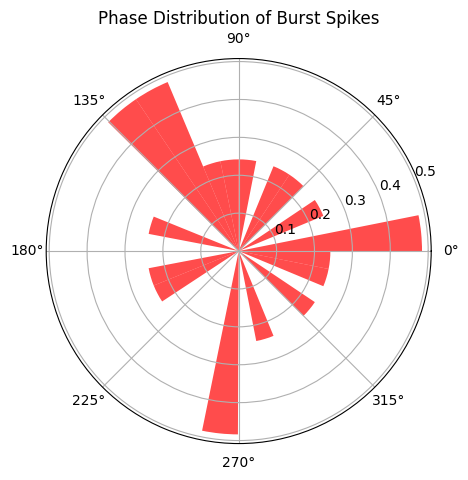

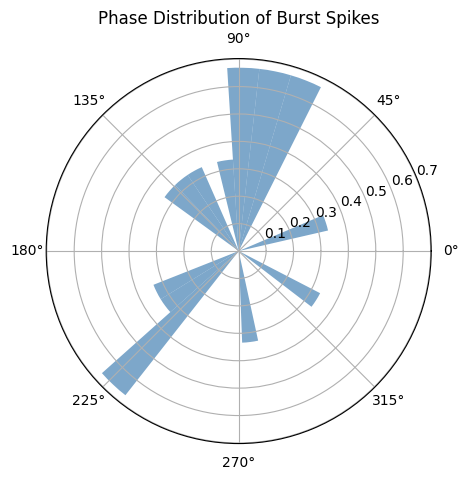

In [152]:
plt.figure(figsize=(5, 5))
plt.subplot(111, polar=True)
plt.hist(burst_phases, bins=30, density=True, color='red', alpha=0.7)
plt.title("Phase Distribution of Burst Spikes")
plt.show()
plt.figure(figsize=(5, 5))
plt.subplot(111, polar=True)
plt.hist(single_phases, bins=30, density=True, color='steelblue', alpha=0.7)
plt.title("Phase Distribution of Burst Spikes")
plt.show()


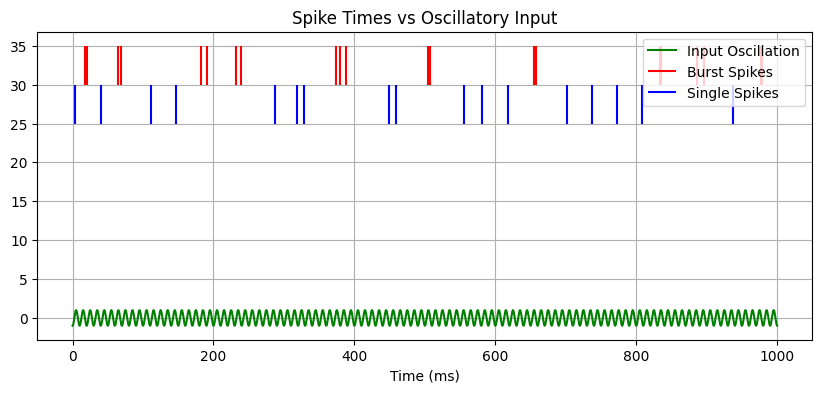

In [149]:
plt.figure(figsize=(10, 4))
plt.plot(t, I_theta, label='Input Oscillation', color='green')
plt.vlines(burst_spikes, ymin=30, ymax=35, color='red', label='Burst Spikes')
plt.vlines(single_spikes, ymin=25, ymax=30, color='blue', label='Single Spikes')
plt.xlabel("Time (ms)")
plt.title("Spike Times vs Oscillatory Input")
plt.legend()
plt.grid(True)
plt.show()


In [84]:

burst_phase_dict = {}
single_phase_dict = {}
plvs_burst = []
plvs_single = []
freq_list = []

N = len(t)

for freq in range(1, 101):
    dt = 0.1
    t = np.arange(0,1000,dt)
    Vs = np.zeros(len(t))
    I = np.zeros(len(t))
    H = np.zeros(len(t))
    Z = np.zeros(len(t))
    threshold = -55
    Gl = 0.1
    El = -58
    Ena = 55
    Ek = -90
    Eh = -32.9
    Gm = 1
    Gnap = 0
    Gh = 0
    Cm = 1
    Gna = 55
    Gk = 12
    Vs[0] = El
    I_theta = np.array([zap_input(i, freq, dt) for i in range(N)])
    n = np.zeros(N)
    Z = np.zeros(N)
    Vs = np.zeros(N)
    I = np.zeros(N)
    h = np.zeros(N)
    H = np.zeros(N)
    Vs[0] = El
    for j in range(N - 1):
        I[j] = 1
        k1vs = (-Gl * (Vs[j] - El)
                - Gnap * pinf(Vs[j]) * (Vs[j] - Ena)
                - Gm * Z[j] * (Vs[j] - Ek)
                - Gh * H[j] * (Vs[j] - Eh)
                - Gna * (minf(Vs[j]) ** 3) * h[j] * (Vs[j] - Ena)
                - Gk * (n[j] ** 4) * (Vs[j] - Ek)
                + I_theta[j]) / Cm
        k1n = (ninf(Vs[j]) - n[j]) / taun(Vs[j])
        k1Z = (Zinf(Vs[j]) - Z[j]) / 75
        k1h = (hinf(Vs[j]) - h[j]) / tauh(Vs[j])
        k1H = (Hinf(Vs[j]) - H[j]) / tauH(Vs[j])
        avs = Vs[j] + k1vs * dt
        an = n[j] + k1n * dt
        aZ = Z[j] + k1Z * dt
        ah = h[j] + k1h * dt
        aH = H[j] + k1H * dt
        k2vs = (-Gl * (avs - El)
                - Gnap * pinf(avs) * (avs - Ena)
                - Gh * aH * (avs - Eh)
                - Gm * aZ * (avs - Ek)
                - Gna * (minf(avs) ** 3) * ah * (avs - Ena)
                - Gk * (an ** 4) * (avs - Ek)
                + I_theta[j]) / Cm
        k2n = (ninf(avs) - an) / taun(avs)
        k2Z = (Zinf(avs) - aZ) / 75
        k2h = (hinf(avs) - ah) / tauh(avs)
        k2H = (Hinf(avs) - aH) / tauH(avs)
        Vs[j + 1] = Vs[j] + (k1vs + k2vs) * dt / 2
        n[j + 1] = n[j] + (k1n + k2n) * dt / 2
        Z[j + 1] = Z[j] + (k1Z + k2Z) * dt / 2
        h[j + 1] = h[j] + (k1h + k2h) * dt / 2
        H[j + 1] = H[j] + (k1H + k2H) * dt / 2

        # if Vs[j] > threshold:
        #         Vs[j] = 20
        #         Vs[j + 1] = -70

    peaks, _ = find_peaks(Vs, height=0)
    spike_times = t[peaks]
    isi = np.diff(spike_times)
    burst_threshold = 20
    burst_starts = []
    spikes_per_burst = []
    i = 0
    used_indices = set()
    while i < len(isi):
        if isi[i] < burst_threshold:
            start = i
            count = 2
            used_indices.add(i)
            used_indices.add(i + 1)
            while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
                i += 1
                count += 1
                used_indices.add(i + 1)
            burst_starts.append(start)
            spikes_per_burst.append(count)
        i += 1
    burst_spikes = []
    single_spikes = []
    for idx, spike_time in enumerate(spike_times):
        if idx in used_indices:
            burst_spikes.append(spike_time)
            
        else:
            single_spikes.append(spike_time)
    analytic_signal = hilbert(I_theta)
    inst_phase = np.angle(analytic_signal)
    burst_peaks = [i for i in peaks if t[i] in burst_spikes]
    single_peaks = [i for i in peaks if t[i] in single_spikes]
    burst_phases = inst_phase[burst_peaks]
    single_phases = inst_phase[single_peaks]
    burst_phase_dict[freq] = burst_phases
    single_phase_dict[freq] = single_phases
    if len(burst_phases) > 0:
        plvs_burst.append(compute_plvu(burst_phases))
    else:
        plvs_burst.append(0)
    if len(single_phases) > 0:
        plvs_single.append(compute_plvu(single_phases))
    else:
        plvs_single.append(0)
    freq_list.append(freq)

plt.figure(figsize=(8, 4))
plt.plot(freq_list, plvs_burst, label='Burst PLV', color='crimson')
plt.plot(freq_list, plvs_single, label='Single PLV', color='steelblue')
plt.xlabel("Input Frequency (Hz)")
plt.ylabel("PLV (Vector Strength)")
plt.title("Phase Locking Value vs Frequency")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

selected_freqs = [5, 10, 20, 40, 60, 80, 100]
fig, axes = plt.subplots(2, len(selected_freqs), subplot_kw={'projection': 'polar'}, figsize=(22, 6))
for i, freq in enumerate(selected_freqs):
    ax1 = axes[0, i]
    ax2 = axes[1, i]
    burst_phases = burst_phase_dict.get(freq, [])
    single_phases = single_phase_dict.get(freq, [])
    if len(burst_phases) > 0:
        ax1.hist(plvs_burst, bins=10, density=True, color='crimson', alpha=0.85)
    ax1.set_title(f"{freq} Hz - Burst", fontsize=10)
    if len(single_phases) > 0:
        ax2.hist(plvs_single, bins=10, density=True, color='steelblue', alpha=0.85)
    ax2.set_title(f"{freq} Hz - Single", fontsize=10)
plt.tight_layout()
plt.show()


KeyboardInterrupt: 

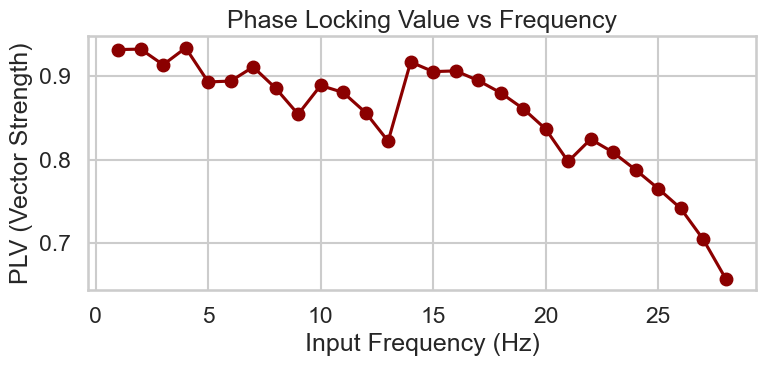

In [117]:
freqs = []
plvs = []

for freq in range(1, 101):
    phases = burst_phase_dict.get(freq, [])
    if len(phases) > 0:
        plv = np.abs(np.mean(np.exp(1j * phases)))
        freqs.append(freq)
        plvs.append(plv)

plt.figure(figsize=(8, 4))
plt.plot(freqs, plvs, marker='o', color='darkred')
plt.xlabel("Input Frequency (Hz)")
plt.ylabel("PLV (Vector Strength)")
plt.title("Phase Locking Value vs Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()


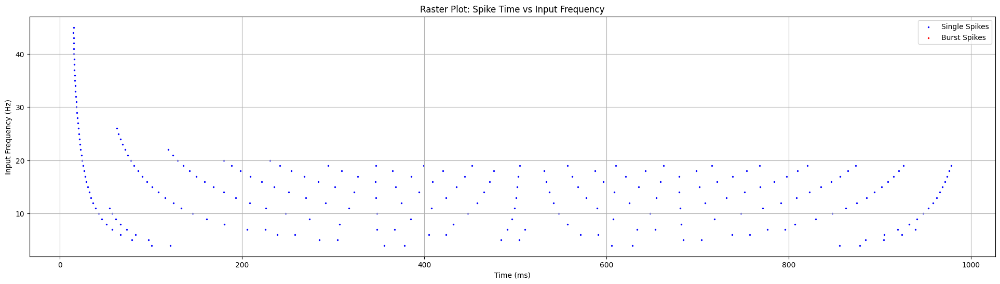

In [35]:
#LIF model

all_spike_times = []
all_freqs = []
burst_spike_times = []
burst_freqs = []
single_spike_times = []
single_freqs = []

burst_counts = []
single_counts = []
spikes_per_burst_all = []


for freq in range(1, 101):
    dt = 0.1
    t = np.arange(0,1000,dt)
    Vs = np.zeros(len(t))
    I = np.zeros(len(t))
    H = np.zeros(len(t))
    Z = np.zeros(len(t))
    threshold = -55
    Gl = 0.1
    El = -58
    Ena = 55
    Ek = -90
    Eh = -32.9
    Gm = 1
    Gnap = 0
    Gh = 0
    Cm = 1
    Vs[0] = El
    I_theta = np.array([zap_input(i, freq, dt) for i in range(len(t))]) 
    for j in range(len(t)-1):

        k1vs = (-Gl*(Vs[j]-El)
        -Gnap*pinf(Vs[j])*(Vs[j]-Ena)
        -Gm*Z[j]*(Vs[j]-Ek)
        -Gh*H[j]*(Vs[j]-Eh)
        +I_theta[j])/Cm
    
        k1Z = (Zinf(Vs[j])-Z[j])/75
        k1H = (Hinf(Vs[j])-H[j])/tauH(Vs[j])

        avs = Vs[j] + k1vs*dt
        aZ = Z[j] + k1Z *dt
        aH = H[j]+k1H*dt

        k2vs = (-Gl*(avs-El)
            -Gnap*pinf(avs)*(avs-Ena)
            -Gh*aH*(avs-Eh)
            -Gm*aZ*(avs-Ek)
            +I_theta[j])/Cm
        
        k2Z = (Zinf(avs)-aZ)/75
        k2H = (Hinf(avs)-aH)/tauH(avs)

        Vs[j+1] = Vs[j] + (k1vs+k2vs) * dt/2
        Z[j+1] = Z[j] + (k1Z+k2Z)*dt/2
        H[j+1] = H[j]+(k1H+k2H)*dt/2 
        
        if Vs[j] > threshold:
            Vs[j] = 20 
            Vs[j+1] = -70

    # plt.plot(t,Vs)
    # plt.show()

    peaks, _ = find_peaks(Vs, height=0)
    spike_times = t[peaks]
    isi = np.diff(spike_times)
    burst_threshold = 10

    burst_starts = []
    spikes_per_burst = []
    i = 0
    used_indices = set()
    while i < len(isi):
        if isi[i] < burst_threshold:
            start = i
            count = 2
            used_indices.add(i)
            used_indices.add(i + 1)
            while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
                i += 1
                count += 1
                used_indices.add(i + 1)
            burst_starts.append(start)
            spikes_per_burst.append(count)
        i += 1

    burst_spikes = []
    single_spikes = []
    for idx, spike_time in enumerate(spike_times):
        if idx in used_indices:
            burst_spikes.append(spike_time)
        else:
            single_spikes.append(spike_time)

    all_spike_times.append(spike_times)

    burst_counts.append(len(burst_spikes))
    single_counts.append(len(single_spikes))
    spikes_per_burst_all.append(spikes_per_burst)

    burst_spike_times.extend(burst_spikes)
    burst_freqs.extend([freq]*len(burst_spikes))
    single_spike_times.extend(single_spikes)
    single_freqs.extend([freq]*len(single_spikes))

    analytic_signal = hilbert(I_theta)

    instantaneous_phase = np.angle(analytic_signal)

    peak_phases = instantaneous_phase[peaks]
    spike_times = t[peaks]

    # print(peak_phases)

    # for i, spike_time in enumerate(spike_times):
    #      print(f"Spike at time {spike_time:.4f} has phase: {peak_phases[i]:.4f} radians")

    # fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
    # n, bins, patches = ax.hist(peak_phases, bins=30, density=True, color='skyblue', edgecolor='black')
    # plt.show()



raster_x_burst = np.array(burst_spike_times)
raster_y_burst = np.array(burst_freqs)
raster_x_single = np.array(single_spike_times)
raster_y_single = np.array(single_freqs)

plt.figure(figsize=(24, 6))
plt.scatter(raster_x_single, raster_y_single, s=2, color='blue', label='Single Spikes')
plt.scatter(raster_x_burst, raster_y_burst, s=2, color='red', label='Burst Spikes')
plt.xlabel("Time (ms)")
plt.ylabel("Input Frequency (Hz)")
plt.title("Raster Plot: Spike Time vs Input Frequency")
plt.legend()
plt.grid(True)
plt.show()


36
36


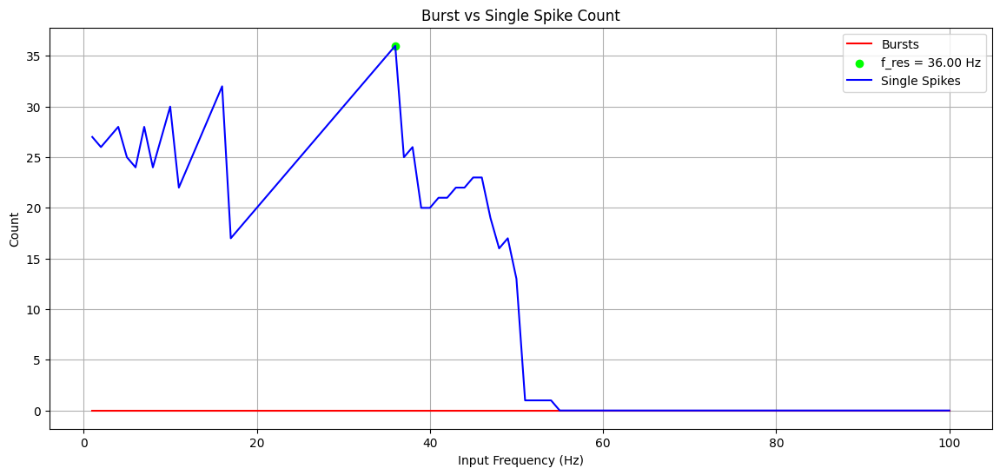

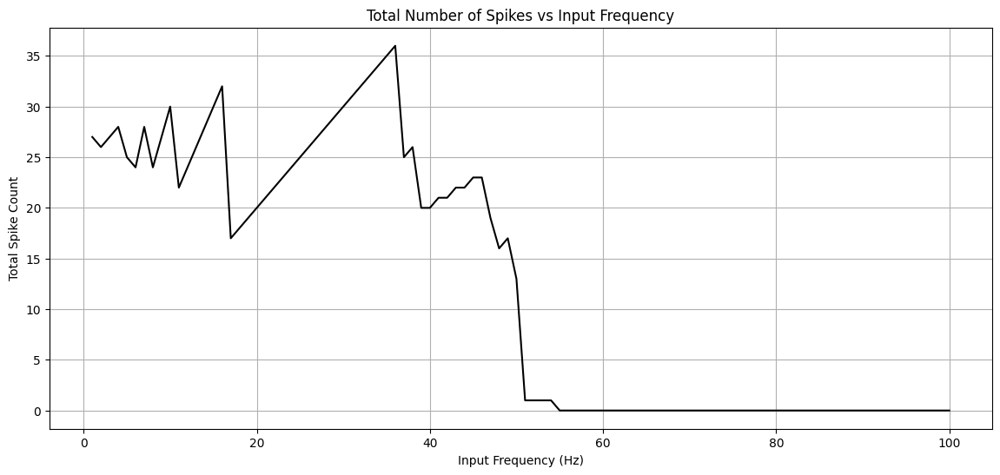

In [59]:
y_max = np.max(single_counts)
print(y_max)
arg_y_max = np.argmax(single_counts) +1
print(arg_y_max)

plt.figure(figsize=(14, 6))
plt.plot(range(1, 101), burst_counts, label='Bursts', color='red')
plt.scatter(arg_y_max,y_max, color='lime', label=f"f_res = {y_max:.2f} Hz")
plt.plot(range(1, 101), single_counts, label='Single Spikes', color='blue')
plt.xlabel("Input Frequency (Hz)")
plt.ylabel("Count")
plt.title("Burst vs Single Spike Count")
plt.legend()
plt.grid(True)
plt.show()

spike_totals = [len(st) for st in all_spike_times]
plt.figure(figsize=(14, 6))
plt.plot(range(1, 101), spike_totals, color='black')
plt.xlabel("Input Frequency (Hz)")
plt.ylabel("Total Spike Count")
plt.title("Total Number of Spikes vs Input Frequency")
plt.grid(True)
plt.show()


In [56]:
tau = 10*10**-3

cutoff_freq = 1/(2*np.pi*tau)

print(cutoff_freq)

15.915494309189533


In [ ]:

Gnap = 0
Gk = 0
Ena = 55
Ek = -90
Cm = 1
dt = 0.01
Gl= 0.1
El = -78
Gm = 1
Gna = 0
Gh = 1
Eh = - 32.9
n = np.zeros(len(t))
Z = np.zeros(len(t))
Vs = np.zeros(len(t))
I = np.zeros(len(t))
h = np.zeros(len(t))
H = np.zeros(len(t))
Vs[0]=El

dt =0.01

t = np.arange(0,1000,dt)

N = len(t)
I_theta = np.array([zap_input(i, 10, dt) for i in range(N)])

0


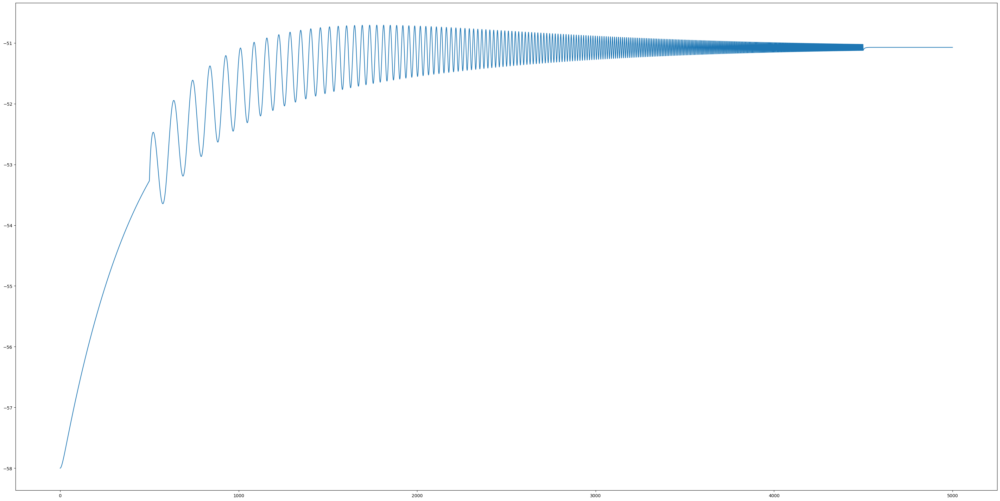

In [166]:
dt =0.1

t = np.arange(0,5000,dt)

N = len(t)
Gnap = 0
Gk = 0
Ena = 55
Ek = -90
Cm = 1
dt = 0.1
Gl= 0.1
El = -58
Gm = 0
Gna = 0
Gh = 1
Eh = - 32.9
n = np.zeros(len(t))
Z = np.zeros(len(t))
Vs = np.zeros(len(t))
I = np.zeros(len(t))
h = np.zeros(len(t))
H = np.zeros(len(t))
Vs[0]=El


I_theta = np.array([zap_input(i, 10, dt) for i in range(len(t))])
for j in range(len(t)-1):
    I[j] = 1

    k1vs = (-Gl*(Vs[j]-El)
        -Gnap*pinf(Vs[j])*(Vs[j]-Ena)
        -Gm*Z[j]*(Vs[j]-Ek)
        -Gh*H[j]*(Vs[j]-Eh)
        -Gna*(minf(Vs[j])**3)*h[j]*(Vs[j]-Ena)
        -Gk*(n[j]**4)* (Vs[j]-Ek)
        +I_chirp[j])/Cm
    
    k1n = (ninf(Vs[j])-n[j])/taun(Vs[j])
    k1Z = (Zinf(Vs[j])-Z[j])/75
    k1h = (hinf(Vs[j])-h[j])/tauh(Vs[j]);
    k1H = (Hinf(Vs[j])-H[j])/tauH(Vs[j])

    avs = Vs[j] + k1vs*dt
    an = n[j] + k1n * dt
    aZ = Z[j] + k1Z *dt
    ah = h[j]+k1h*dt
    aH = H[j]+k1H*dt;

    k2vs = (-Gl*(avs-El)
        -Gnap*pinf(avs)*(avs-Ena)
        -Gh*aH*(avs-Eh)
        -Gm*aZ*(avs-Ek)
        -Gna*(minf(avs)**3)*ah*(avs-Ena)
        -Gk*(an**4)*(avs-Ek)
        +I_chirp[j])/Cm
    
    k2n = (ninf(avs)-an)/taun(avs)
    k2Z = (Zinf(avs)-aZ)/75
    k2h = (hinf(avs)-ah)/tauh(avs)
    k2H = (Hinf(avs)-aH)/tauH(avs)

    Vs[j+1] = Vs[j] + (k1vs+k2vs) * dt/2
    n[j+1] = n[j] + (k1n+k2n) * dt/2 
    Z[j+1] = Z[j] + (k1Z+k2Z)*dt/2
    h[j+1] = h[j]+(k1h+k2h)*dt/2
    H[j+1] = H[j]+(k1H+k2H)*dt/2

plt.figure(figsize=(40,20))
plt.plot(t,Vs) 


from scipy.signal import find_peaks
peaks, _ = find_peaks(Vs, height=0)
    
spike_times = np.array(t)[peaks]
 
spike_count = len(spike_times)
print(spike_count)



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

dt = 0.1
t = np.arange(0, 1000, dt)
N = len(t)
Cm = 1
Ena = 55
Ek = -90
El = -58
Eh = -32.9
Gl = 0.1
Gm = 1
Gnap = 0
Gk = 4
Gna = 85
Gh = 0

all_spike_times = []
all_freqs = []
burst_counts = []
single_counts = []
burst_end = []

I_theta = np.array([zap_input(i, 40, dt) for i in range(N)])
n = np.zeros(N)
Z = np.zeros(N)
Vs = np.zeros(N)
I = np.zeros(N)
h = np.zeros(N)
H = np.zeros(N)
Vs[0] = El

for j in range(N - 1):
    I[j] = 1

    k1vs = (-Gl * (Vs[j] - El)
            - Gnap * pinf(Vs[j]) * (Vs[j] - Ena)
            - Gm * Z[j] * (Vs[j] - Ek)
            - Gh * H[j] * (Vs[j] - Eh)
            - Gna * (minf(Vs[j]) ** 3) * h[j] * (Vs[j] - Ena)
            - Gk * (n[j] ** 4) * (Vs[j] - Ek)
            + I_theta[j]) / Cm

    k1n = (ninf(Vs[j]) - n[j]) / taun(Vs[j])
    k1Z = (Zinf(Vs[j]) - Z[j]) / 75
    k1h = (hinf(Vs[j]) - h[j]) / tauh(Vs[j])
    k1H = (Hinf(Vs[j]) - H[j]) / tauH(Vs[j])

    avs = Vs[j] + k1vs * dt
    an = n[j] + k1n * dt
    aZ = Z[j] + k1Z * dt
    ah = h[j] + k1h * dt
    aH = H[j] + k1H * dt

    k2vs = (-Gl * (avs - El)
            - Gnap * pinf(avs) * (avs - Ena)
            - Gh * aH * (avs - Eh)
            - Gm * aZ * (avs - Ek)
            - Gna * (minf(avs) ** 3) * ah * (avs - Ena)
            - Gk * (an ** 4) * (avs - Ek)
            + I_theta[j]) / Cm

    k2n = (ninf(avs) - an) / taun(avs)
    k2Z = (Zinf(avs) - aZ) / 75
    k2h = (hinf(avs) - ah) / tauh(avs)
    k2H = (Hinf(avs) - aH) / tauH(avs)

    Vs[j + 1] = Vs[j] + (k1vs + k2vs) * dt / 2
    n[j + 1] = n[j] + (k1n + k2n) * dt / 2
    Z[j + 1] = Z[j] + (k1Z + k2Z) * dt / 2
    h[j + 1] = h[j] + (k1h + k2h) * dt / 2
    H[j + 1] = H[j] + (k1H + k2H) * dt / 2

peaks, _ = find_peaks(Vs, height=0)
spike_times = t[peaks]
all_spike_times.append(spike_times)
all_freqs.append(np.full_like(spike_times, 40))

isi = np.diff(spike_times)
burst_threshold = 10

burst_starts = []
spikes_per_burst = []
used_indices = set()
i = 0
while i < len(isi):
    if isi[i] < burst_threshold:
        start_index = i
        burst_intervals = 1
        used_indices.add(i)
        used_indices.add(i + 1)
        while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
            i += 1
            burst_intervals += 1
            used_indices.add(i + 1)
        burst_starts.append(start_index)
        spikes_per_burst.append(burst_intervals + 1)
        
    i += 1

burst_spikes = 0
single_spikes = 0
for idx, _ in enumerate(spike_times):
    if idx in used_indices:
        burst_spikes += 1
        
    else:
        single_spikes += 1

burst_counts.append(len(spikes_per_burst))
single_counts.append(single_spikes)

raster_x = np.concatenate(all_spike_times)
raster_y = np.concatenate(all_freqs)

spike_totals = [len(st) for st in all_spike_times]

plt.figure(figsize=(14, 6))
plt.plot(t, Vs)
plt.show()

plt.figure(figsize=(14, 6))
plt.plot(n, Z)
plt.show()

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(t, Z, Vs, c='skyblue')
plt.show()

burst_num = len(spikes_per_burst)
print(f"Total spikes: {spike_totals[0]}")
print(f"Single spikes: {single_spikes}")
print(f"Burst spikes: {burst_spikes}")
print(f"Spikes per burst: {spikes_per_burst}")
print(f"# of burst: {burst_num}")


print(f"end of a burst {burst_end}")


TypeError: 'int' object is not iterable

In [ ]:
# Assume `isi` is a pre-calculated list of interspike intervals
# Assume `burst_threshold` is a defined value
burst_starts = []  # Stores the starting index of each burst
spikes_per_burst = [] # Stores the spike count for each burst

i = 0
while i < len(isi):
    if isi[i] < burst_threshold:
        start_index = i
        burst_intervals = 1
        
        # Continue advancing as long as the ISI is below the threshold
        while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
            i += 1
            burst_intervals += 1
        
        # A burst requires at least two spikes, which means at least one interval
        if burst_intervals >= 1:
            burst_starts.append(start_index)
            # The number of spikes is the number of intervals plus one
            spikes_per_burst.append(burst_intervals + 1)
        
    i += 1

print("Start index of each detected burst:", burst_starts)
print("Number of spikes for each burst:", spikes_per_burst)


Start index of each detected burst: [5, 7, 24, 26]
Number of spikes for each burst: [2, 2, 2, 2]


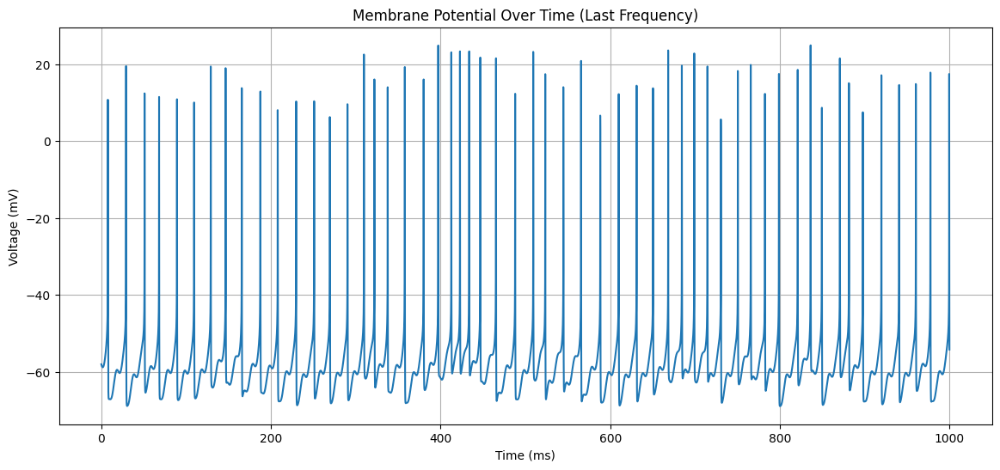

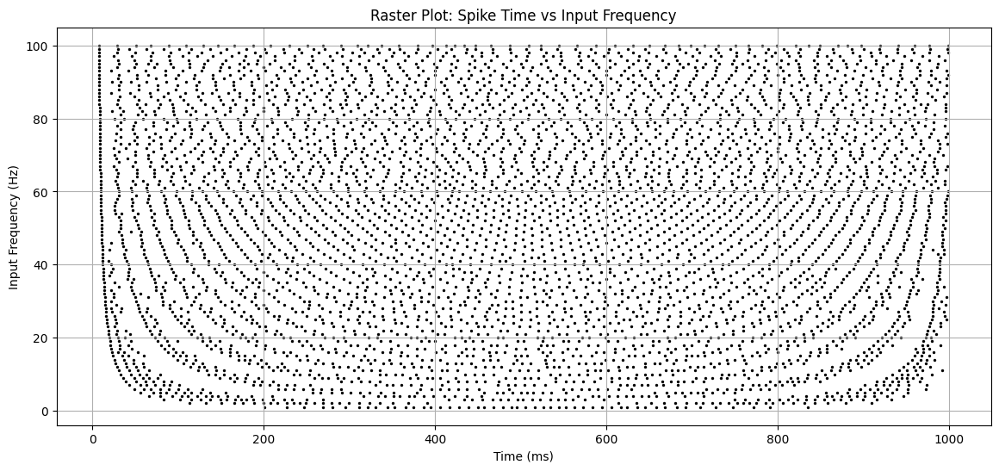

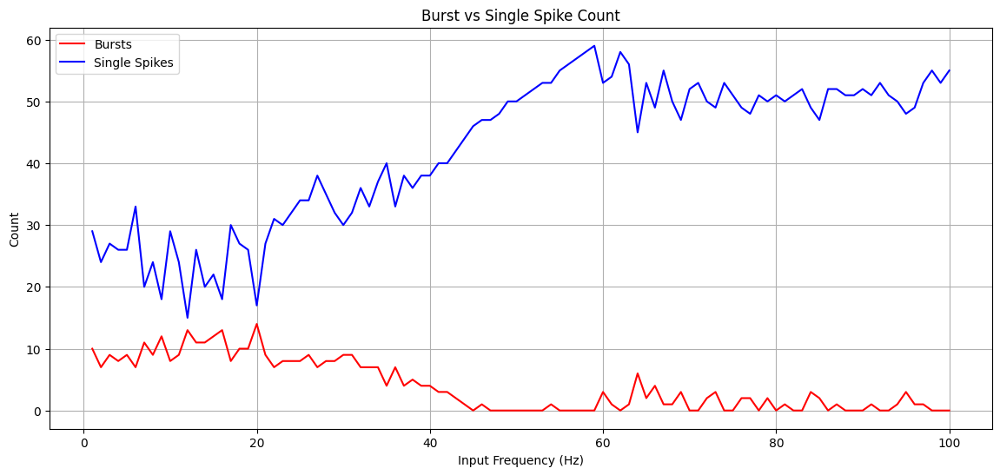

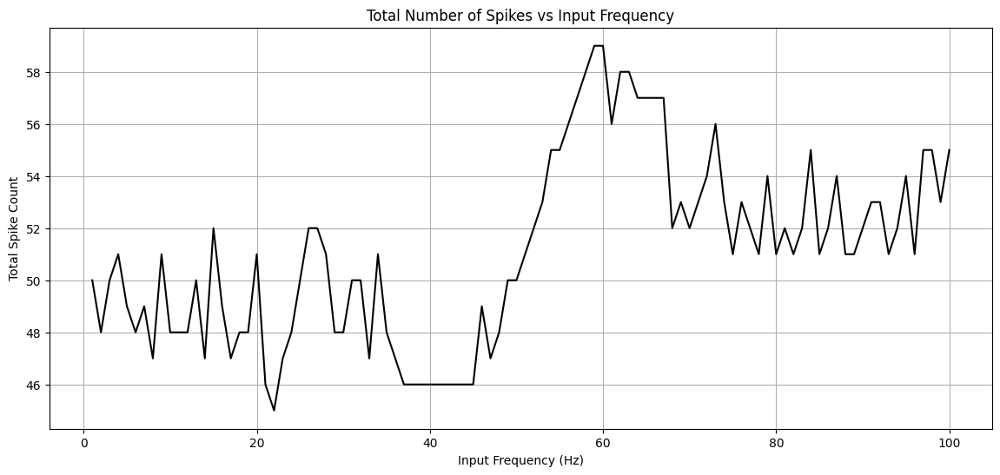

In [128]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

dt = 0.1
t = np.arange(0, 1000, dt)
N = len(t)
Cm = 1
Ena = 55
Ek = -90
El = -58
Eh = -32.9
Gl = 0.1
Gm = 0
Gnap = 0
Gk = 12
Gna = 55
Gh = 0

all_spike_times = []
all_freqs = []
burst_counts = []
single_counts = []
spikes_per_burst_all = []

for freq in range(1, 101):
    I_theta = np.array([zap_input(i, freq, dt) for i in range(N)])
    n = np.zeros(N)
    Z = np.zeros(N)
    Vs = np.zeros(N)
    I = np.zeros(N)
    h = np.zeros(N)
    H = np.zeros(N)
    Vs[0] = El

    for j in range(N - 1):
        I[j] = 1

        k1vs = (-Gl * (Vs[j] - El)
                - Gnap * pinf(Vs[j]) * (Vs[j] - Ena)
                - Gm * Z[j] * (Vs[j] - Ek)
                - Gh * H[j] * (Vs[j] - Eh)
                - Gna * (minf(Vs[j]) ** 3) * h[j] * (Vs[j] - Ena)
                - Gk * (n[j] ** 4) * (Vs[j] - Ek)
                + I_theta[j]) / Cm

        k1n = (ninf(Vs[j]) - n[j]) / taun(Vs[j])
        k1Z = (Zinf(Vs[j]) - Z[j]) / 75
        k1h = (hinf(Vs[j]) - h[j]) / tauh(Vs[j])
        k1H = (Hinf(Vs[j]) - H[j]) / tauH(Vs[j])

        avs = Vs[j] + k1vs * dt
        an = n[j] + k1n * dt
        aZ = Z[j] + k1Z * dt
        ah = h[j] + k1h * dt
        aH = H[j] + k1H * dt

        k2vs = (-Gl * (avs - El)
                - Gnap * pinf(avs) * (avs - Ena)
                - Gh * aH * (avs - Eh)
                - Gm * aZ * (avs - Ek)
                - Gna * (minf(avs) ** 3) * ah * (avs - Ena)
                - Gk * (an ** 4) * (avs - Ek)
                + I_theta[j]) / Cm

        k2n = (ninf(avs) - an) / taun(avs)
        k2Z = (Zinf(avs) - aZ) / 75
        k2h = (hinf(avs) - ah) / tauh(avs)
        k2H = (Hinf(avs) - aH) / tauH(avs)

        Vs[j + 1] = Vs[j] + (k1vs + k2vs) * dt / 2
        n[j + 1] = n[j] + (k1n + k2n) * dt / 2
        Z[j + 1] = Z[j] + (k1Z + k2Z) * dt / 2
        h[j + 1] = h[j] + (k1h + k2h) * dt / 2
        H[j + 1] = H[j] + (k1H + k2H) * dt / 2

    peaks, _ = find_peaks(Vs, height=0)
    spike_times = t[peaks]
    all_spike_times.append(spike_times)
    all_freqs.append(np.full_like(spike_times, freq))

    isi = np.diff(spike_times)
    burst_threshold = 10
    burst_starts = []
    spikes_per_burst = []

    i = 0
    used_indices = set()
    while i < len(isi):
        if isi[i] < burst_threshold:
            start = i
            count = 2
            used_indices.add(i)
            used_indices.add(i + 1)
            while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
                i += 1
                count += 1
                used_indices.add(i + 1)
            burst_starts.append(start)
            spikes_per_burst.append(count)
        i += 1

    num_bursts = len(burst_starts)
    num_spikes_in_bursts = sum(spikes_per_burst)
    num_singles = len(spike_times) - num_spikes_in_bursts

    burst_counts.append(num_bursts)
    single_counts.append(num_singles)
    spikes_per_burst_all.append(spikes_per_burst)

raster_x = np.concatenate(all_spike_times)
raster_y = np.concatenate(all_freqs)
spike_totals = [len(st) for st in all_spike_times]

plt.figure(figsize=(14, 6))
plt.plot(t, Vs)
plt.title("Membrane Potential Over Time (Last Frequency)")
plt.xlabel("Time (ms)")
plt.ylabel("Voltage (mV)")
plt.grid(True)
plt.show()

plt.figure(figsize=(14, 6))
plt.scatter(raster_x, raster_y, s=2, color='black')
plt.xlabel("Time (ms)")
plt.ylabel("Input Frequency (Hz)")
plt.title("Raster Plot: Spike Time vs Input Frequency")
plt.grid(True)
plt.show()

plt.figure(figsize=(14, 6))
plt.plot(range(1, 101), burst_counts, label='Bursts', color='red')
plt.plot(range(1, 101), single_counts, label='Single Spikes', color='blue')
plt.xlabel("Input Frequency (Hz)")
plt.ylabel("Count")
plt.title("Burst vs Single Spike Count")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(14, 6))
plt.plot(range(1, 101), spike_totals, color='black')
plt.xlabel("Input Frequency (Hz)")
plt.ylabel("Total Spike Count")
plt.title("Total Number of Spikes vs Input Frequency")
plt.grid(True)
plt.show()


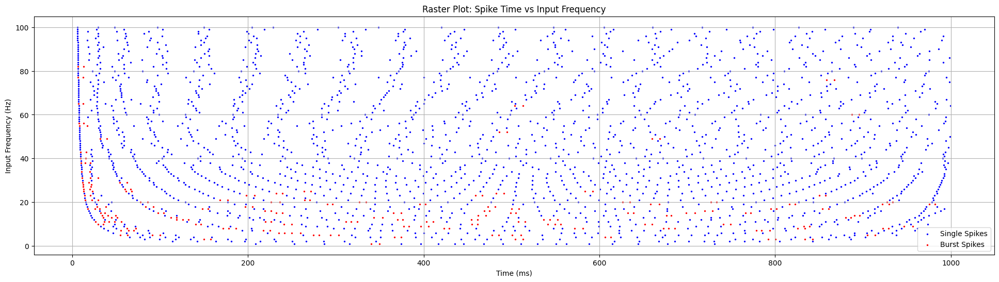

In [126]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

dt = 0.1
t = np.arange(0, 1000, dt)
N = len(t)
Cm = 1
Ena = 55
Ek = -90
El = -58
Eh = -32.9
Gl = 0.1
Gm = 1
Gnap = 0.1
Gk = 12
Gna = 55
Gh = 0

all_spike_times = []
all_freqs = []
burst_spike_times = []
burst_freqs = []
single_spike_times = []
single_freqs = []

burst_counts = []
single_counts = []
spikes_per_burst_all = []

for freq in range(1, 101):
    I_theta = np.array([zap_input(i, freq, dt) for i in range(N)])
    n = np.zeros(N)
    Z = np.zeros(N)
    Vs = np.zeros(N)
    I = np.zeros(N)
    h = np.zeros(N)
    H = np.zeros(N)
    Vs[0] = El

    for j in range(N - 1):
        I[j] = 1

        k1vs = (-Gl * (Vs[j] - El)
                - Gnap * pinf(Vs[j]) * (Vs[j] - Ena)
                - Gm * Z[j] * (Vs[j] - Ek)
                - Gh * H[j] * (Vs[j] - Eh)
                - Gna * (minf(Vs[j]) ** 3) * h[j] * (Vs[j] - Ena)
                - Gk * (n[j] ** 4) * (Vs[j] - Ek)
                + I_theta[j]) / Cm

        k1n = (ninf(Vs[j]) - n[j]) / taun(Vs[j])
        k1Z = (Zinf(Vs[j]) - Z[j]) / 75
        k1h = (hinf(Vs[j]) - h[j]) / tauh(Vs[j])
        k1H = (Hinf(Vs[j]) - H[j]) / tauH(Vs[j])

        avs = Vs[j] + k1vs * dt
        an = n[j] + k1n * dt
        aZ = Z[j] + k1Z * dt
        ah = h[j] + k1h * dt
        aH = H[j] + k1H * dt

        k2vs = (-Gl * (avs - El)
                - Gnap * pinf(avs) * (avs - Ena)
                - Gh * aH * (avs - Eh)
                - Gm * aZ * (avs - Ek)
                - Gna * (minf(avs) ** 3) * ah * (avs - Ena)
                - Gk * (an ** 4) * (avs - Ek)
                + I_theta[j]) / Cm

        k2n = (ninf(avs) - an) / taun(avs)
        k2Z = (Zinf(avs) - aZ) / 75
        k2h = (hinf(avs) - ah) / tauh(avs)
        k2H = (Hinf(avs) - aH) / tauH(avs)

        Vs[j + 1] = Vs[j] + (k1vs + k2vs) * dt / 2
        n[j + 1] = n[j] + (k1n + k2n) * dt / 2
        Z[j + 1] = Z[j] + (k1Z + k2Z) * dt / 2
        h[j + 1] = h[j] + (k1h + k2h) * dt / 2
        H[j + 1] = H[j] + (k1H + k2H) * dt / 2

    peaks, _ = find_peaks(Vs, height=0)
    spike_times = t[peaks]
    isi = np.diff(spike_times)
    burst_threshold = 10

    burst_starts = []
    spikes_per_burst = []
    i = 0
    used_indices = set()
    while i < len(isi):
        if isi[i] < burst_threshold:
            start = i
            count = 2
            used_indices.add(i)
            used_indices.add(i + 1)
            while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
                i += 1
                count += 1
                used_indices.add(i + 1)
            burst_starts.append(start)
            spikes_per_burst.append(count)
        i += 1

    burst_spikes = []
    single_spikes = []
    for idx, spike_time in enumerate(spike_times):
        if idx in used_indices:
            burst_spikes.append(spike_time)
        else:
            single_spikes.append(spike_time)

    burst_counts.append(len(burst_spikes))
    single_counts.append(len(single_spikes))
    spikes_per_burst_all.append(spikes_per_burst)

    burst_spike_times.extend(burst_spikes)
    burst_freqs.extend([freq]*len(burst_spikes))
    single_spike_times.extend(single_spikes)
    single_freqs.extend([freq]*len(single_spikes))

raster_x_burst = np.array(burst_spike_times)
raster_y_burst = np.array(burst_freqs)
raster_x_single = np.array(single_spike_times)
raster_y_single = np.array(single_freqs)

plt.figure(figsize=(24, 6))
plt.scatter(raster_x_single, raster_y_single, s=2, color='blue', label='Single Spikes')
plt.scatter(raster_x_burst, raster_y_burst, s=2, color='red', label='Burst Spikes')
plt.xlabel("Time (ms)")
plt.ylabel("Input Frequency (Hz)")
plt.title("Raster Plot: Spike Time vs Input Frequency")
plt.legend()
plt.grid(True)
plt.show()


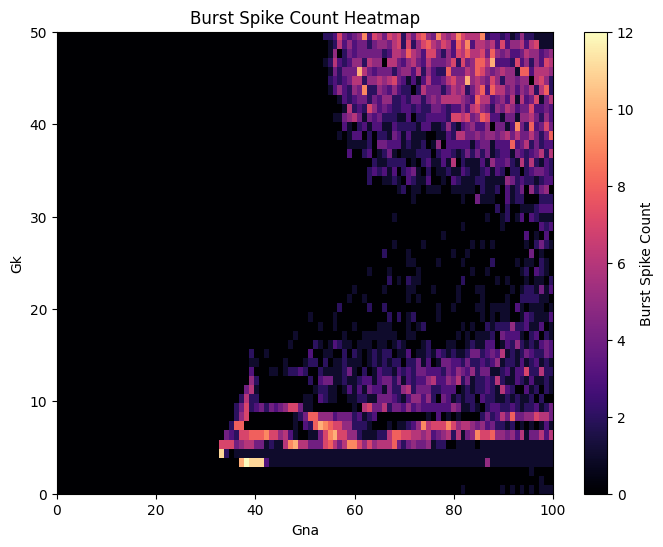

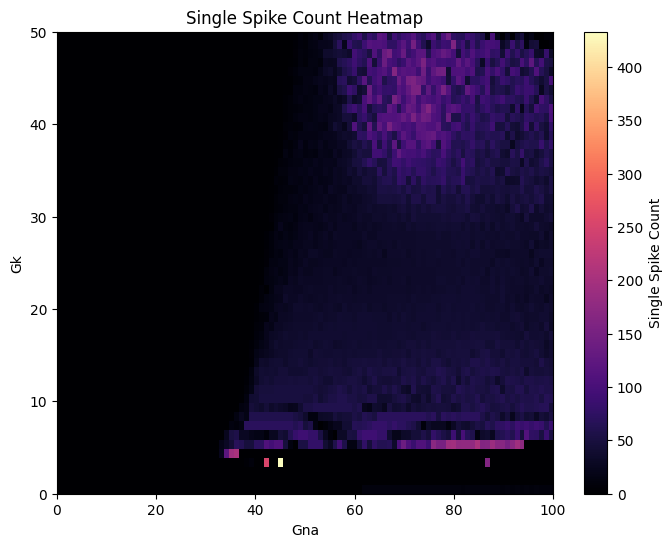

In [229]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

Gk_vals = np.arange(0, 51, 1)
Gna_vals = np.arange(0, 101, 1)

burst_matrix = np.zeros((len(Gk_vals), len(Gna_vals)))
single_matrix = np.zeros((len(Gk_vals), len(Gna_vals)))
spikes_per_burst_all = [[[] for _ in range(len(Gna_vals))] for _ in range(len(Gk_vals))]

dt = 0.1
t = np.arange(0, 1000, dt)
N = len(t)
Cm = 1
Ena = 55
Ek = -90
El = -58
Eh = -32.9
Gl = 0.1
Gm = 0
Gnap = 0
Gh = 1

for i, Gk_var in enumerate(Gk_vals):
    for j, Gna_var in enumerate(Gna_vals):
        n = np.zeros(N)
        Z = np.zeros(N)
        Vs = np.zeros(N)
        I = np.zeros(N)
        h = np.zeros(N)
        H = np.zeros(N)
        Vs[0] = El
        I_theta = np.array([zap_input(k, 10, dt) for k in range(N)])

        for k in range(N - 1):
            I[k] = 1

            k1vs = (-Gl * (Vs[k] - El)
                    - Gnap * pinf(Vs[k]) * (Vs[k] - Ena)
                    - Gm * Z[k] * (Vs[k] - Ek)
                    - Gh * H[k] * (Vs[k] - Eh)
                    - Gna_var * (minf(Vs[k]) ** 3) * h[k] * (Vs[k] - Ena)
                    - Gk_var * (n[k] ** 4) * (Vs[k] - Ek)
                    + I_theta[k]) / Cm

            k1n = (ninf(Vs[k]) - n[k]) / taun(Vs[k])
            k1Z = (Zinf(Vs[k]) - Z[k]) / 75
            k1h = (hinf(Vs[k]) - h[k]) / tauh(Vs[k])
            k1H = (Hinf(Vs[k]) - H[k]) / tauH(Vs[k])

            avs = Vs[k] + k1vs * dt
            an = n[k] + k1n * dt
            aZ = Z[k] + k1Z * dt
            ah = h[k] + k1h * dt
            aH = H[k] + k1H * dt

            k2vs = (-Gl * (avs - El)
                    - Gnap * pinf(avs) * (avs - Ena)
                    - Gh * aH * (avs - Eh)
                    - Gm * aZ * (avs - Ek)
                    - Gna_var * (minf(avs) ** 3) * ah * (avs - Ena)
                    - Gk_var * (an ** 4) * (avs - Ek)
                    + I_theta[k]) / Cm

            k2n = (ninf(avs) - an) / taun(avs)
            k2Z = (Zinf(avs) - aZ) / 75
            k2h = (hinf(avs) - ah) / tauh(avs)
            k2H = (Hinf(avs) - aH) / tauH(avs)

            Vs[k + 1] = Vs[k] + (k1vs + k2vs) * dt / 2
            n[k + 1] = n[k] + (k1n + k2n) * dt / 2
            Z[k + 1] = Z[k] + (k1Z + k2Z) * dt / 2
            h[k + 1] = h[k] + (k1h + k2h) * dt / 2
            H[k + 1] = H[k] + (k1H + k2H) * dt / 2

        # peaks, _ = find_peaks(Vs, height=0)
        # spike_times = t[peaks]
        # isi = np.diff(spike_times)
        # burst_threshold = 10

        # burst_starts = []
        # spikes_per_burst = []
        # idx = 0
        # used_indices = set()
        # while idx < len(isi):
        #     if isi[idx] < burst_threshold:
        #         start = idx
        #         count = 2
        #         used_indices.add(idx)
        #         used_indices.add(idx + 1)
        #         while idx + 1 < len(isi) and isi[idx + 1] < burst_threshold:
        #             idx += 1
        #             count += 1
        #             used_indices.add(idx + 1)
        #         burst_starts.append(start)
        #         spikes_per_burst.append(count)
        #     idx += 1

        # burst_spikes = 0
        # single_spikes = 0
        # for idx, _ in enumerate(spike_times):
        #     if idx in used_indices:
        #         burst_spikes += 1
        #     else:
        #         single_spikes += 1

        peaks, _ = find_peaks(Vs, height=0)
        spike_times = t[peaks]
        isi = np.diff(spike_times)

        # Burst criteria
        min_spikes_in_burst = 2
        burst_isi_max = 10      # ms
        burst_end_gap = 20      # ms

        # Containers
        burst_spikes = []
        single_spikes = []
        all_bursts = []

        # Burst detection loop
        current_burst = [spike_times[0]] if len(spike_times) > 0 else []

        for idx in range(1, len(spike_times)):
            interval = spike_times[idx] - spike_times[idx - 1]

            if interval <= burst_isi_max:
                current_burst.append(spike_times[idx])
            else:
                # Check for valid burst
                if len(current_burst) >= min_spikes_in_burst:
                    # Only end burst if there's a 30ms gap after it
                    if interval >= burst_end_gap:
                        all_bursts.append(current_burst)
                        burst_spikes.extend(current_burst)
                    else:
                        # Didn't meet end-gap criteria, treat all as singles
                        single_spikes.extend(current_burst)
                else:
                    single_spikes.extend(current_burst)
                
                current_burst = [spike_times[idx]]

        # Check last burst at end
        if len(current_burst) >= min_spikes_in_burst:
            all_bursts.append(current_burst)
            burst_spikes.extend(current_burst)
        else:
            single_spikes.extend(current_burst)
        
        burst_matrix[i, j] = len(all_bursts)
        single_matrix[i, j] = len(single_spikes)
        #spikes_per_burst_all[i][j] = spikes_per_burst

plt.figure(figsize=(8, 6))
plt.imshow(burst_matrix, extent=[Gna_vals[0], Gna_vals[-1], Gk_vals[0], Gk_vals[-1]], origin='lower', aspect='auto', cmap='magma')
plt.colorbar(label='Burst Spike Count')
plt.xlabel('Gna')
plt.ylabel('Gk')
plt.title('Burst Spike Count Heatmap')
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(single_matrix, extent=[Gna_vals[0], Gna_vals[-1], Gk_vals[0], Gk_vals[-1]], origin='lower', aspect='auto', cmap='magma')
plt.colorbar(label='Single Spike Count')
plt.xlabel('Gna')
plt.ylabel('Gk')
plt.title('Single Spike Count Heatmap')
plt.show()


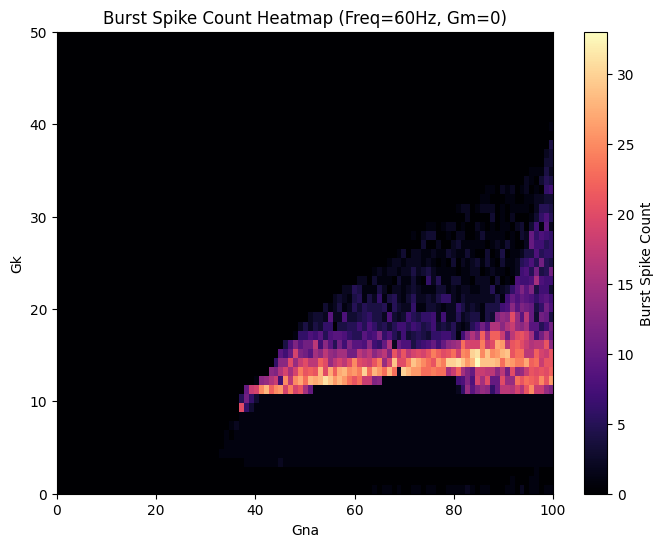

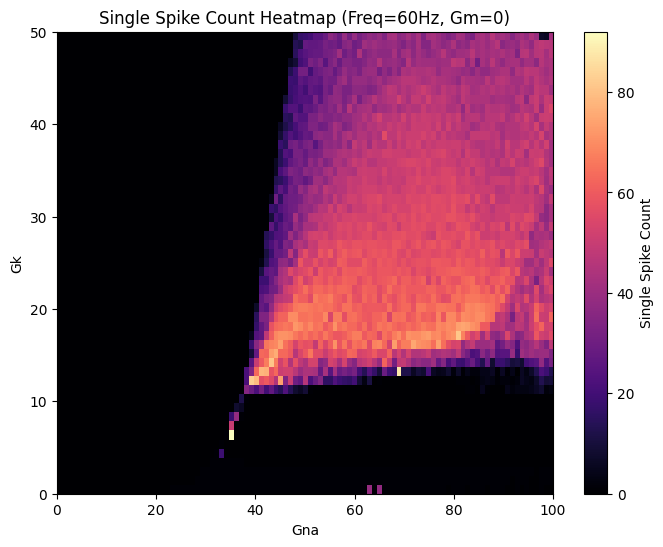

KeyboardInterrupt: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def run_simulation(freq, gm_val):
    Gk_vals = np.arange(0, 51, 1)
    Gna_vals = np.arange(0, 101, 1)

    burst_matrix = np.zeros((len(Gk_vals), len(Gna_vals)))
    single_matrix = np.zeros((len(Gk_vals), len(Gna_vals)))

    dt = 0.1
    t = np.arange(0, 1000, dt)
    N = len(t)
    Cm = 1
    Ena = 55
    Ek = -90
    El = -58
    Eh = -32.9
    Gl = 0.1
    Gm = gm_val
    Gnap = 0
    Gh = 0

    for i, Gk_var in enumerate(Gk_vals):
        for j, Gna_var in enumerate(Gna_vals):
            n = np.zeros(N)
            Z = np.zeros(N)
            Vs = np.zeros(N)
            I = np.zeros(N)
            h = np.zeros(N)
            H = np.zeros(N)
            Vs[0] = El
            I_theta = np.array([zap_input(k, freq, dt) for k in range(N)])

            for k in range(N - 1):
                I[k] = 1

                k1vs = (-Gl * (Vs[k] - El)
                        - Gnap * pinf(Vs[k]) * (Vs[k] - Ena)
                        - Gm * Z[k] * (Vs[k] - Ek)
                        - Gh * H[k] * (Vs[k] - Eh)
                        - Gna_var * (minf(Vs[k]) ** 3) * h[k] * (Vs[k] - Ena)
                        - Gk_var * (n[k] ** 4) * (Vs[k] - Ek)
                        + I_theta[k]) / Cm

                k1n = (ninf(Vs[k]) - n[k]) / taun(Vs[k])
                k1Z = (Zinf(Vs[k]) - Z[k]) / 75
                k1h = (hinf(Vs[k]) - h[k]) / tauh(Vs[k])
                k1H = (Hinf(Vs[k]) - H[k]) / tauH(Vs[k])

                avs = Vs[k] + k1vs * dt
                an = n[k] + k1n * dt
                aZ = Z[k] + k1Z * dt
                ah = h[k] + k1h * dt
                aH = H[k] + k1H * dt

                k2vs = (-Gl * (avs - El)
                        - Gnap * pinf(avs) * (avs - Ena)
                        - Gh * aH * (avs - Eh)
                        - Gm * aZ * (avs - Ek)
                        - Gna_var * (minf(avs) ** 3) * ah * (avs - Ena)
                        - Gk_var * (an ** 4) * (avs - Ek)
                        + I_theta[k]) / Cm

                k2n = (ninf(avs) - an) / taun(avs)
                k2Z = (Zinf(avs) - aZ) / 75
                k2h = (hinf(avs) - ah) / tauh(avs)
                k2H = (Hinf(avs) - aH) / tauH(avs)

                Vs[k + 1] = Vs[k] + (k1vs + k2vs) * dt / 2
                n[k + 1] = n[k] + (k1n + k2n) * dt / 2
                Z[k + 1] = Z[k] + (k1Z + k2Z) * dt / 2
                h[k + 1] = h[k] + (k1h + k2h) * dt / 2
                H[k + 1] = H[k] + (k1H + k2H) * dt / 2

            peaks, _ = find_peaks(Vs, height=0)
            spike_times = t[peaks]
            isi = np.diff(spike_times)
            burst_threshold = 10

            used_indices = set()
            spikes_per_burst = []
            idx = 0
            while idx < len(isi):
                if isi[idx] < burst_threshold:
                    count = 2
                    used_indices.add(idx)
                    used_indices.add(idx + 1)
                    while idx + 1 < len(isi) and isi[idx + 1] < burst_threshold:
                        idx += 1
                        count += 1
                        used_indices.add(idx + 1)
                    spikes_per_burst.append(count)
                idx += 1

            burst_spikes = 0
            single_spikes = 0
            for idx in range(len(spike_times)):
                if idx in used_indices:
                    burst_spikes += 1
                else:
                    single_spikes += 1

            burst_matrix[i, j] = len(spikes_per_burst)
            single_matrix[i, j] = single_spikes

    return burst_matrix, single_matrix

frequencies = [60, 80]
gm_values = [0, 1]

for freq in frequencies:
    for gm in gm_values:
        burst, single = run_simulation(freq, gm)

        plt.figure(figsize=(8, 6))
        plt.imshow(burst, extent=[0, 100, 0, 50], origin='lower', aspect='auto', cmap='magma')
        plt.colorbar(label='Burst Spike Count')
        plt.xlabel('Gna')
        plt.ylabel('Gk')
        plt.title(f'Burst Spike Count Heatmap (Freq={freq}Hz, Gm={gm})')
        plt.show()

        plt.figure(figsize=(8, 6))
        plt.imshow(single, extent=[0, 100, 0, 50], origin='lower', aspect='auto', cmap='magma')
        plt.colorbar(label='Single Spike Count')
        plt.xlabel('Gna')
        plt.ylabel('Gk')
        plt.title(f'Single Spike Count Heatmap (Freq={freq}Hz, Gm={gm})')
        plt.show()


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.signal import find_peaks


# all_spike_times = []
# all_freqs = []
# burst_counts = []
# single_counts = []

# for freq in range(1, 101):
#     I_chirp = np.array([zap_input(i, freq, dt) for i in range(N)])
#     n = np.zeros(N)
#     Z = np.zeros(N)
#     Vs = np.zeros(N)
#     I = np.zeros(N)
#     h = np.zeros(N)
#     H = np.zeros(N)
#     Vs[0] = El

#     for j in range(N - 1):
#         I[j] = 1

#         k1vs = (-Gl * (Vs[j] - El)
#                 - Gnap * pinf(Vs[j]) * (Vs[j] - Ena)
#                 - Gm * Z[j] * (Vs[j] - Ek)
#                 - Gh * H[j] * (Vs[j] - Eh)
#                 - Gna * (minf(Vs[j]) ** 3) * h[j] * (Vs[j] - Ena)
#                 - Gk * (n[j] ** 4) * (Vs[j] - Ek)
#                 + I_chirp[j]) / Cm

#         k1n = -n[j] / 1
#         k1Z = -Z[j] / 75
#         k1h = -h[j] / 1
#         k1H = -H[j] / 1

#         avs = Vs[j] + k1vs * dt
#         an = n[j] + k1n * dt
#         aZ = Z[j] + k1Z * dt
#         ah = h[j] + k1h * dt
#         aH = H[j] + k1H * dt

#         k2vs = (-Gl * (avs - El)
#                 - Gnap * pinf(avs) * (avs - Ena)
#                 - Gh * aH * (avs - Eh)
#                 - Gm * aZ * (avs - Ek)
#                 - Gna * (minf(avs) ** 3) * ah * (avs - Ena)
#                 - Gk * (an ** 4) * (avs - Ek)
#                 + I_chirp[j]) / Cm

#         k2n = -an / 1
#         k2Z = -aZ / 75
#         k2h = -ah / 1
#         k2H = -aH / 1

#         Vs[j + 1] = Vs[j] + (k1vs + k2vs) * dt / 2
#         n[j + 1] = n[j] + (k1n + k2n) * dt / 2
#         Z[j + 1] = Z[j] + (k1Z + k2Z) * dt / 2
#         h[j + 1] = h[j] + (k1h + k2h) * dt / 2
#         H[j + 1] = H[j] + (k1H + k2H) * dt / 2

#     peaks, _ = find_peaks(Vs, height=0)
#     spike_times = t[peaks]
#     all_spike_times.append(spike_times)
#     all_freqs.append(np.full_like(spike_times, freq))

#     isi = np.diff(spike_times)
#     burst_threshold = 20
#     burst_indices = np.where(isi < burst_threshold)[0]

#     burst_starts = []
#     i = 0
#     while i < len(isi) - 1:
#         if isi[i] < burst_threshold:
#             start = i
#             while i < len(isi) and isi[i] < burst_threshold:
#                 i += 1
#             if i - start >= 1:
#                 burst_starts.append(start)
#         else:
#             i += 1

#     bursts = len(burst_starts)
#     singles = len(spike_times) - sum([(isi[i+1] - isi[i] < burst_threshold) for i in burst_starts]) - bursts
#     burst_counts.append(bursts)
#     single_counts.append(singles)

# raster_x = np.concatenate(all_spike_times)
# raster_y = np.concatenate(all_freqs)

# plt.figure(figsize=(14, 6))
# plt.scatter(raster_x, raster_y, s=2, color='black')
# plt.xlabel("Time (ms)")
# plt.ylabel("Input Frequency (Hz)")
# plt.title("Raster Plot: Spike Time vs Input Frequency")
# plt.grid(True)
# plt.show()

# plt.figure(figsize=(14, 6))
# plt.plot(range(1, 101), burst_counts, label='Bursts', color='red')
# plt.plot(range(1, 101), single_counts, label='Single Spikes', color='blue')
# plt.xlabel("Input Frequency (Hz)")
# plt.ylabel("Count")
# plt.title("Burst vs Single Spike Count")
# plt.legend()
# plt.grid(True)
# plt.show()


In [172]:
import numpy as np
from scipy.ndimage import gaussian_filter1d
def compute_impedance_fft(V, I, dt, smooth_sigma=None, f_max=None):
    N = len(V)
    # FFTs (remove DC offset first!)
    V_fft = np.fft.fft(V - np.mean(V))
    I_fft = np.fft.fft(I - np.mean(I))

    # Impedance spectrum
    Z = np.abs(V_fft / I_fft)[:N//2]
    freqs = np.fft.fftfreq(N, dt/1000)[:N//2]  # dt in ms → s

    # Mask out DC and optionally limit to f_max
    mask = freqs > 1   # throw away 0 Hz
    if f_max is not None:
        mask &= (freqs <= f_max)

    freqs, Z = freqs[mask], Z[mask]

    # Optional smoothing
    if smooth_sigma is not None:
        Z = gaussian_filter1d(Z, sigma=smooth_sigma)

    return freqs, Z




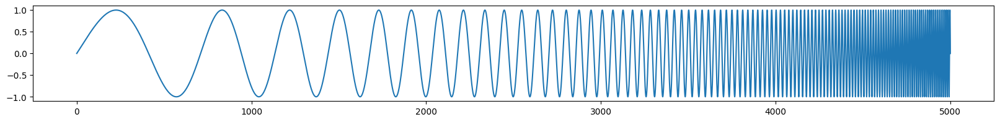

In [174]:
t = np.arange(0,5000,dt)
def zap_log(t, f_start=0.0, f_end=100.0, amplitude=1, cycles_per_freq=1, silence_ms=1000):
    T = t[-1] - t[0]
    k = np.log(f_end / f_start) / T
    phase = 2 * np.pi * cycles_per_freq * f_start * (np.exp(k * t) - 1) / k
    I_zap = amplitude * np.sin(phase)
    freq_inst = f_start * np.exp(k * t)
    
    # Set first and last silence_ms milliseconds to zero amplitude
    silence_s = silence_ms / 1000
    I_zap[(t <= silence_s)] = 0
    I_zap[(t >= (t[-1] - silence_s))] = 0
    
    return I_zap, freq_inst

I_chirp, freq_inst = zap_log(t/1000.0, f_start=1, f_end=100.0, amplitude=1, cycles_per_freq=1, silence_ms=0)

plt.figure(figsize=(20,2))
plt.plot(t, I_chirp)

56


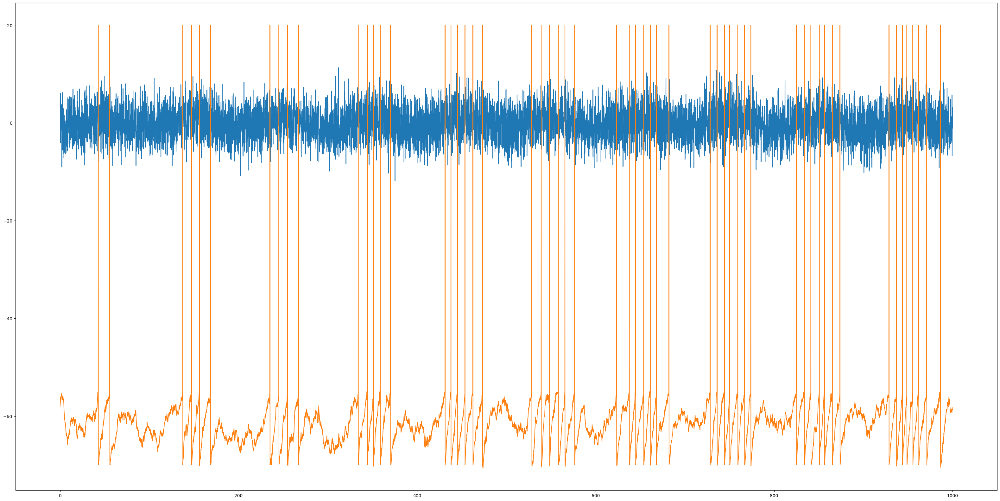

In [235]:
from scipy.signal import chirp

threshold = -55

dt =0.1

t = np.arange(0,1000,dt)

N = len(t)
Gnap = 0.1
Gk = 0
Ena = 55
Ek = -90
Cm = 1
dt = 0.1
Gl= 0.1
El = -58
Gm = 1
Gna =0
Gh = 1
Eh = - 32.9
n = np.zeros(len(t))
Z = np.zeros(len(t))
Vs = np.zeros(len(t))
I = np.zeros(len(t))
h = np.zeros(len(t))
H = np.zeros(len(t))
Vs[0]=El


I_theta = np.array([zap_input(i, 10, dt) for i in range(N)])+noise
for j in range(len(t)-1):
    I[j] = 1

    k1vs = (-Gl*(Vs[j]-El)
        -Gnap*pinf(Vs[j])*(Vs[j]-Ena)
        -Gm*Z[j]*(Vs[j]-Ek)
        -Gh*H[j]*(Vs[j]-Eh)
        -Gna*(minf(Vs[j])**3)*h[j]*(Vs[j]-Ena)
        -Gk*(n[j]**4)* (Vs[j]-Ek)
        +I_theta[j])/Cm
    
    k1n = (ninf(Vs[j])-n[j])/taun(Vs[j])
    k1Z = (Zinf(Vs[j])-Z[j])/75
    k1h = (hinf(Vs[j])-h[j])/tauh(Vs[j]);
    k1H = (Hinf(Vs[j])-H[j])/tauH(Vs[j])

    avs = Vs[j] + k1vs*dt
    an = n[j] + k1n * dt
    aZ = Z[j] + k1Z *dt
    ah = h[j]+k1h*dt
    aH = H[j]+k1H*dt

    k2vs = (-Gl*(avs-El)
        -Gnap*pinf(avs)*(avs-Ena)
        -Gh*aH*(avs-Eh)
        -Gm*aZ*(avs-Ek)
        -Gna*(minf(avs)**3)*ah*(avs-Ena)
        -Gk*(an**4)*(avs-Ek)
        +I_theta[j])/Cm
    
    k2n = (ninf(avs)-an)/taun(avs)
    k2Z = (Zinf(avs)-aZ)/75
    k2h = (hinf(avs)-ah)/tauh(avs)
    k2H = (Hinf(avs)-aH)/tauH(avs)

    Vs[j+1] = Vs[j] + (k1vs+k2vs) * dt/2
    n[j+1] = n[j] + (k1n+k2n) * dt/2 
    Z[j+1] = Z[j] + (k1Z+k2Z)*dt/2
    h[j+1] = h[j]+(k1h+k2h)*dt/2
    H[j+1] = H[j]+(k1H+k2H)*dt/2

    if Vs[j] > threshold:
            Vs[j] = 20 
            Vs[j+1] = -70

plt.figure(figsize=(40,20))
plt.plot(t,I_theta)
plt.plot(t,Vs) 


from scipy.signal import find_peaks
peaks, _ = find_peaks(Vs, height=0)
    
spike_times = np.array(t)[peaks]
 
spike_count = len(spike_times)
print(spike_count)



In [168]:
from scipy.signal import hilbert

def calculate_resonance(t, signal, freq_inst):
    analytic_signal = hilbert(signal)
    envelope = np.abs(analytic_signal)
    peak_idx = np.argmax(envelope)
    resonance_freq = freq_inst[peak_idx]
    return resonance_freq

resonance_frequency = calculate_resonance(t/1000.0, Vs, freq_inst)
print("Resonance frequency:", resonance_frequency)


Resonance frequency: 1.0


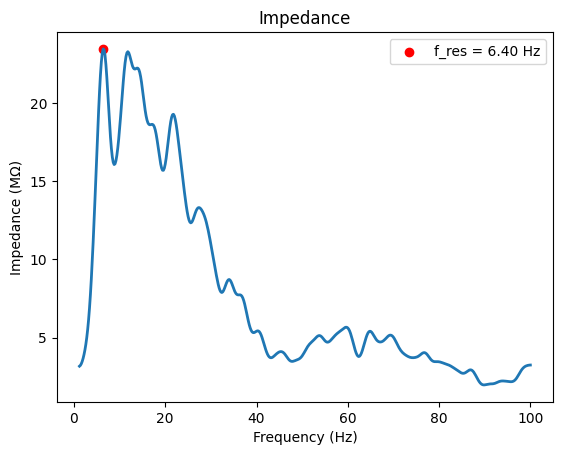

In [188]:
freq_cycles_1, Z_cycles_1 = compute_impedance_fft(Vs, I_chirp, dt,smooth_sigma=5,f_max=100)

f_res_1 = freq_cycles_1[np.argmax(Z_cycles_1)]
Z_max_1 = Z_cycles_1.max()

plt.plot(freq_cycles_1, Z_cycles_1, lw=2)
plt.scatter(f_res_1, Z_max_1, color='red', label=f"f_res = {f_res_1:.2f} Hz")
plt.title("Impedance")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Impedance (MΩ)")
plt.legend()

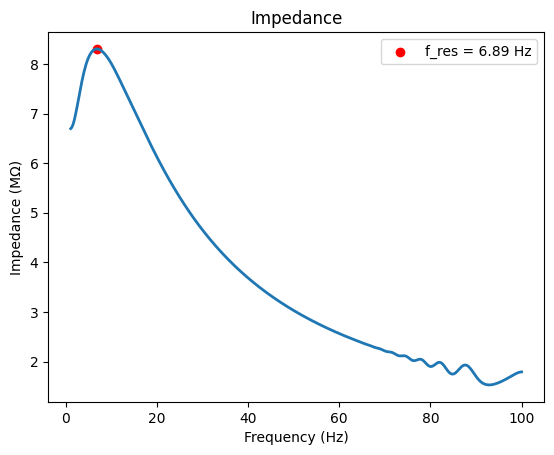

In [110]:
trim_time = 500
samples_to_trim = int(trim_time / dt)
Vs_trimmed = Vs[samples_to_trim:]
I_chirp_trimmed = I_chirp[samples_to_trim:]
min_len = min(len(Vs_trimmed), len(I_chirp_trimmed))
Vs_trimmed = Vs_trimmed[:min_len]
I_chirp_trimmed = I_chirp_trimmed[:min_len]
freq_cycles_1, Z_cycles_1 = compute_impedance_fft(
    Vs_trimmed, I_chirp_trimmed, dt, smooth_sigma=5, f_max=100
)
f_res_1 = freq_cycles_1[np.argmax(Z_cycles_1)]
Z_max_1 = Z_cycles_1.max()
plt.plot(freq_cycles_1, Z_cycles_1, lw=2)
plt.scatter(f_res_1, Z_max_1, color='red', label=f"f_res = {f_res_1:.2f} Hz")
plt.title("Impedance")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Impedance (MΩ)")
plt.legend()
plt.show()


setting up gating dynamics


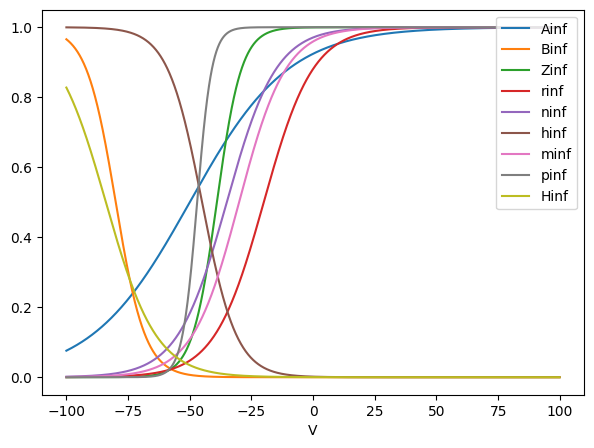

gating dynamic setup completed


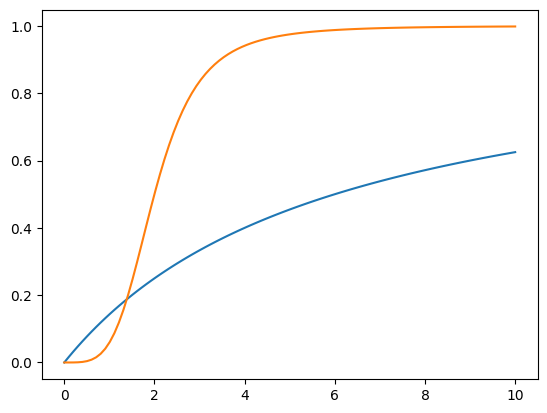

In [248]:
print("setting up gating dynamics")
#gating varibles
tauq0 = 200
aq=2
Ca_acum = np.linspace(0.0001, 10, 100)

def minf(V):
    return 1.0/(1+np.exp(-(V--30)/9.5))
def hinf(V):
    return  1.0/(1+np.exp(-(V--45)/-7))
def tauh(V):
    return 0.1 + 0.75*(1.0/(1+np.exp(-(V--40.5)/-6)))
def ninf(V):
    return 1.0/(1+np.exp(-(V--35)/10))
def taun(V):
    return 0.1 + 0.5*(1.0/(1+np.exp(-(V--27)/-15)))
def pinf(V):
    return 1.0/(1+np.exp(-(V--47)/3))#can range from -47 to -41 #
def rinf(V):
    return 1/ (1 + np.exp(-(V--20)/10))
def Zinf(V):
    return 1.0/(1+np.exp(-(V--39)/5))
def Ainf(V):
    return 1.0/(1+np.exp(-(V--50)/20))
def Binf(V):
    return 1.0/(1+np.exp(-(V--80)/-6))
def Hinf(V):
    return 1./(1. + np.exp((V + 84.)/10.2))
def tauH(V):
    return  1./(np.exp(-17.9 - 0.116*V ) + np.exp(-1.84 + 0.09*V )) + 0.1
def cinf(V):
    return  1.0/(1+np.exp(-(V--30)/7))
def dinf(Ca_acum):
    return 1.0/(1+6/Ca_acum)
def Qinf(Ca_acum):
    return 1.0/(1+(aq**4)/(Ca_acum**4))
def Nv(V):
    return ( 1+np.tanh((V)/4))
def Nv2(V):
    return ( 1+np.tanh((V)/4))



vv = np.arange(-100,100 , 0.1)
fig = plt.figure(figsize=(7, 5))
#ax = plt.subplot(gs[0])
plt.plot(vv,Ainf(vv),label = "Ainf")
plt.plot(vv,Binf(vv),label = "Binf")
plt.plot(vv,Zinf(vv),label = "Zinf")
plt.plot(vv,rinf(vv),label = "rinf")
plt.plot(vv,ninf(vv), label = "ninf")
plt.plot(vv,hinf(vv), label = "hinf")
plt.plot(vv,minf(vv), label = "minf")
plt.plot(vv,pinf(vv), label = "pinf")
plt.plot(vv,Hinf(vv), label = "Hinf")
plt.legend(loc='upper right')
plt.xlabel("V")

# #ax = plt.subplot(gs[1])
# plt.plot(vv,taun(vv), label = "taun")
# plt.plot(vv,tauh(vv), label = "tauh")
# plt.plot(vv,tauH(vv), label = "tauH")

# plt.legend(loc='upper right')

# plt.xlabel("V")

#ax = plt.subplot(gs[2])
plt.show()
plt.plot(Ca_acum,dinf(Ca_acum))
plt.plot(Ca_acum,Qinf(Ca_acum))

print("gating dynamic setup completed")

[10 Hz] Total spikes: 52
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 52
[10 Hz] Single spikes: 0
PLVu Burst [0.337315456631477] @ freq 10 Hz
PLVu Spike [0] @ freq 10 Hz


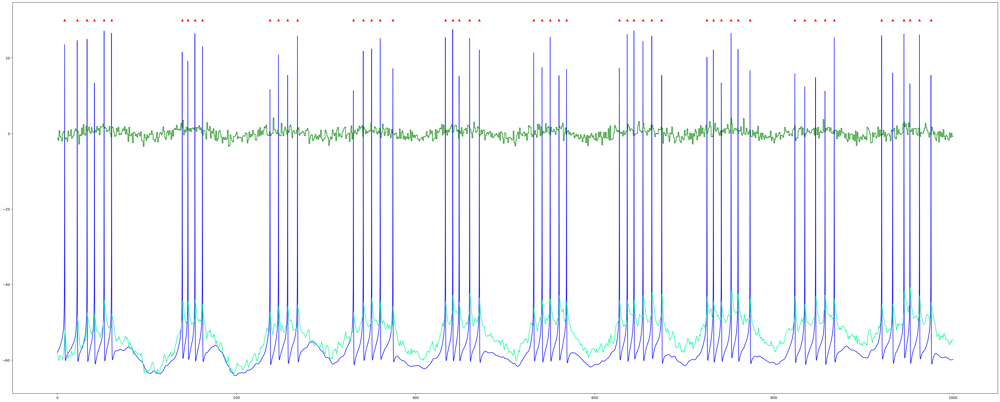

[10 Hz] Total spikes: 52
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 51
[10 Hz] Single spikes: 1
PLVu Burst [0.337315456631477, 0.3894597468780908] @ freq 10 Hz
PLVu Spike [0, 0] @ freq 10 Hz


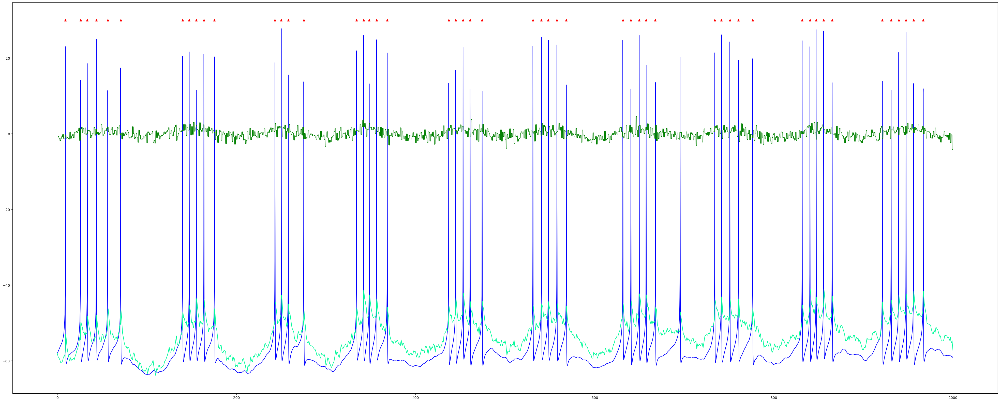

[10 Hz] Total spikes: 52
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 52
[10 Hz] Single spikes: 0
PLVu Burst [0.337315456631477, 0.3894597468780908, 0.37379169952406077] @ freq 10 Hz
PLVu Spike [0, 0, 0] @ freq 10 Hz


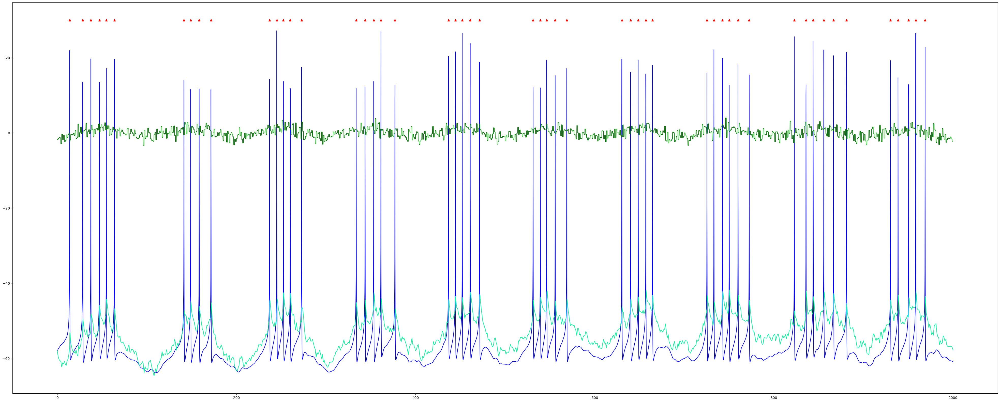

[10 Hz] Total spikes: 51
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 49
[10 Hz] Single spikes: 2
PLVu Burst [0.337315456631477, 0.3894597468780908, 0.37379169952406077, 0.4182390115213035] @ freq 10 Hz
PLVu Spike [0, 0, 0, 0.954864544746644] @ freq 10 Hz


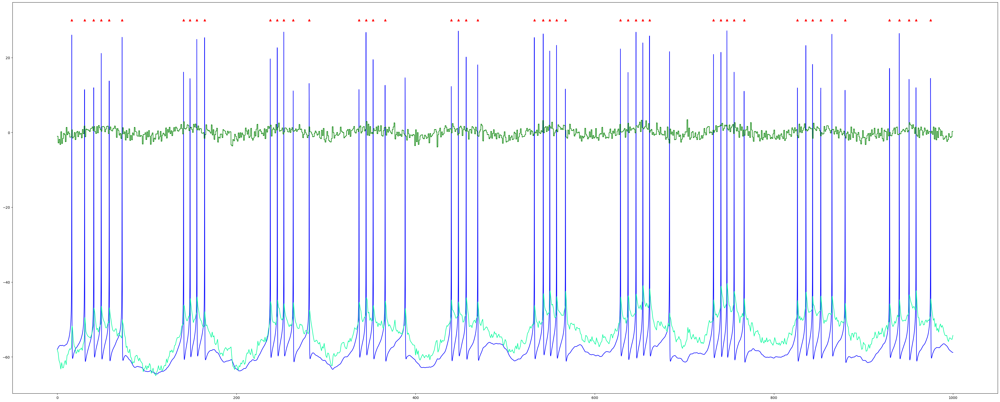

[10 Hz] Total spikes: 53
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 52
[10 Hz] Single spikes: 1
PLVu Burst [0.337315456631477, 0.3894597468780908, 0.37379169952406077, 0.4182390115213035, 0.35577956023688384] @ freq 10 Hz
PLVu Spike [0, 0, 0, 0.954864544746644, 0] @ freq 10 Hz


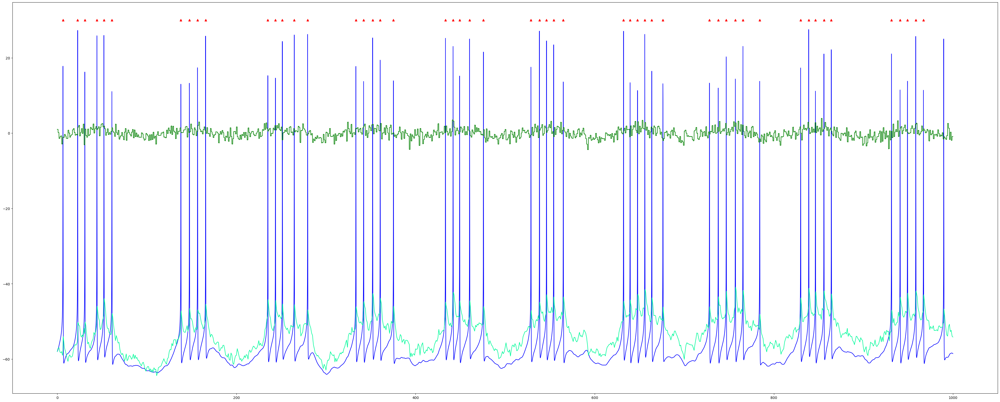

[10 Hz] Total spikes: 53
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 53
[10 Hz] Single spikes: 0
PLVu Burst [0.337315456631477, 0.3894597468780908, 0.37379169952406077, 0.4182390115213035, 0.35577956023688384, 0.3582402444907599] @ freq 10 Hz
PLVu Spike [0, 0, 0, 0.954864544746644, 0, 0] @ freq 10 Hz


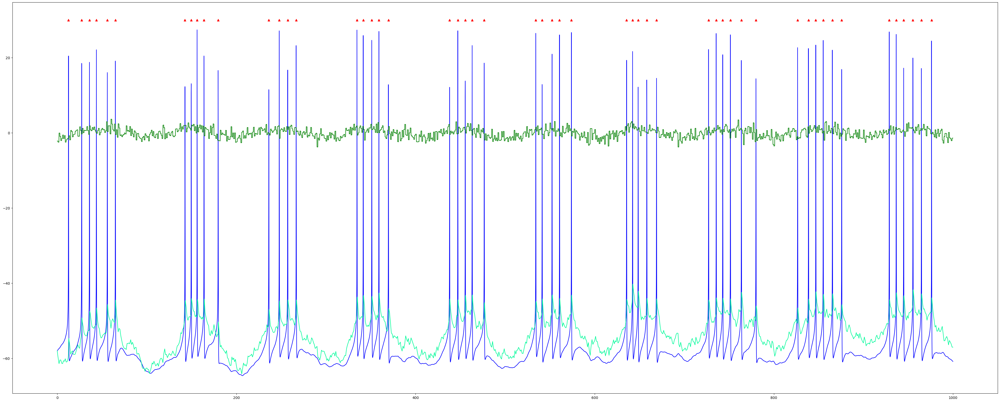

[10 Hz] Total spikes: 52
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 50
[10 Hz] Single spikes: 2
PLVu Burst [0.337315456631477, 0.3894597468780908, 0.37379169952406077, 0.4182390115213035, 0.35577956023688384, 0.3582402444907599, 0.3791900133778377] @ freq 10 Hz
PLVu Spike [0, 0, 0, 0.954864544746644, 0, 0, 0.06906002571441006] @ freq 10 Hz


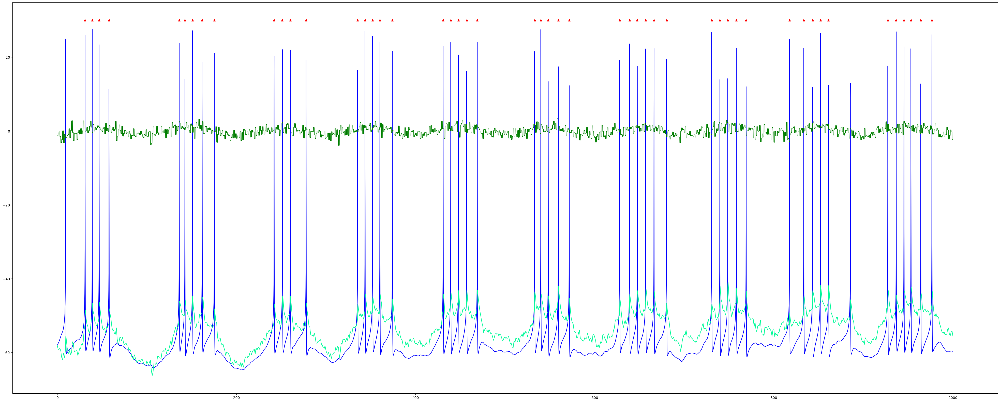

[10 Hz] Total spikes: 51
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 49
[10 Hz] Single spikes: 2
PLVu Burst [0.337315456631477, 0.3894597468780908, 0.37379169952406077, 0.4182390115213035, 0.35577956023688384, 0.3582402444907599, 0.3791900133778377, 0.3802775289733253] @ freq 10 Hz
PLVu Spike [0, 0, 0, 0.954864544746644, 0, 0, 0.06906002571441006, 0.9785809043254725] @ freq 10 Hz


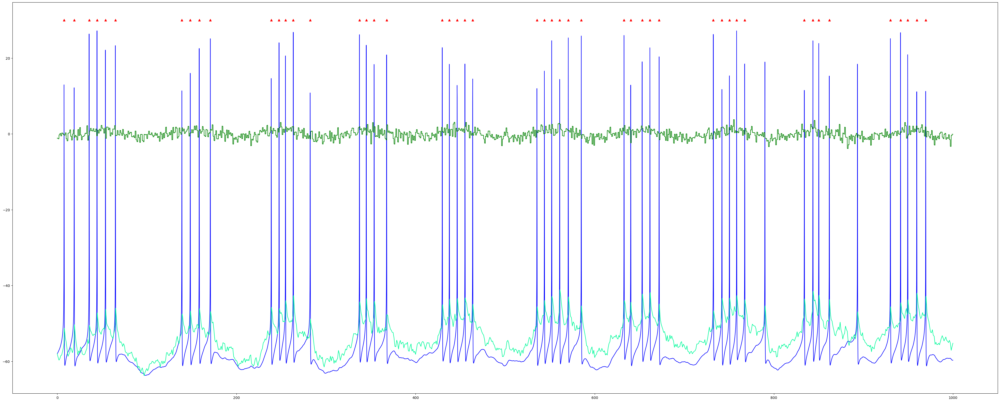

[10 Hz] Total spikes: 50
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 47
[10 Hz] Single spikes: 3
PLVu Burst [0.337315456631477, 0.3894597468780908, 0.37379169952406077, 0.4182390115213035, 0.35577956023688384, 0.3582402444907599, 0.3791900133778377, 0.3802775289733253, 0.4830571125099765] @ freq 10 Hz
PLVu Spike [0, 0, 0, 0.954864544746644, 0, 0, 0.06906002571441006, 0.9785809043254725, 0.33159925634305265] @ freq 10 Hz


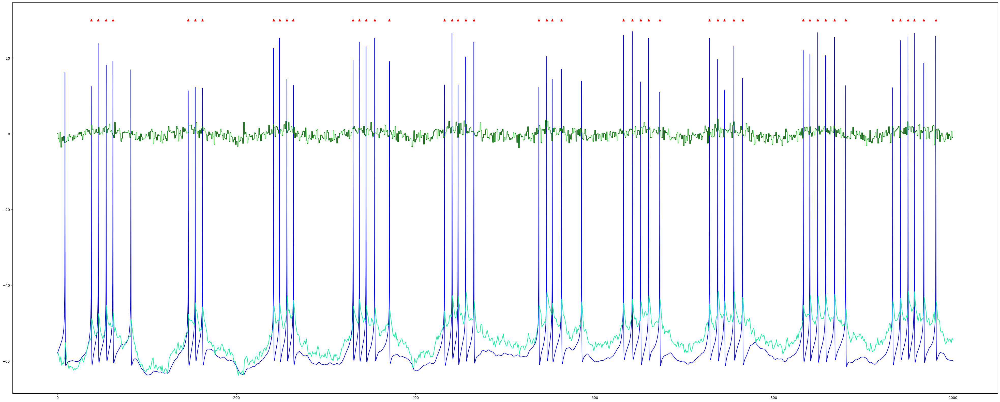

[10 Hz] Total spikes: 51
[10 Hz] Total bursts detected: 10
[10 Hz] Spikes in bursts: 50
[10 Hz] Single spikes: 1
PLVu Burst [0.337315456631477, 0.3894597468780908, 0.37379169952406077, 0.4182390115213035, 0.35577956023688384, 0.3582402444907599, 0.3791900133778377, 0.3802775289733253, 0.4830571125099765, 0.34544673338825904] @ freq 10 Hz
PLVu Spike [0, 0, 0, 0.954864544746644, 0, 0, 0.06906002571441006, 0.9785809043254725, 0.33159925634305265, 0] @ freq 10 Hz


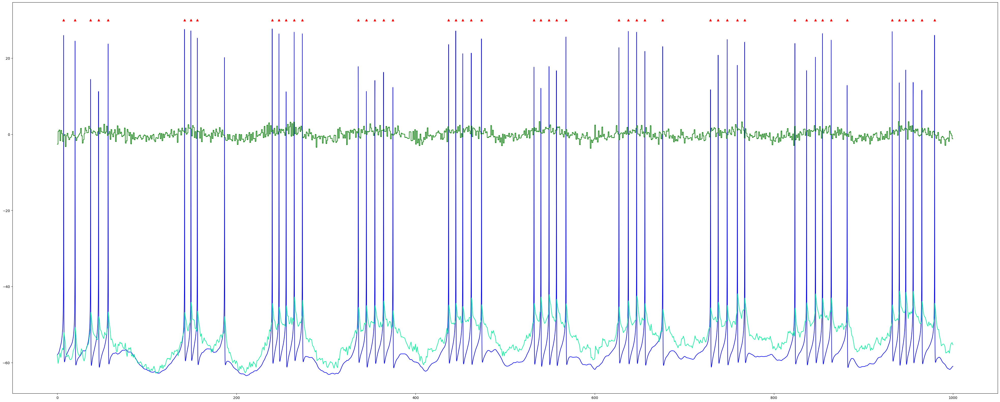

ValueError: x and y must have same first dimension, but have shapes (1,) and (10,)

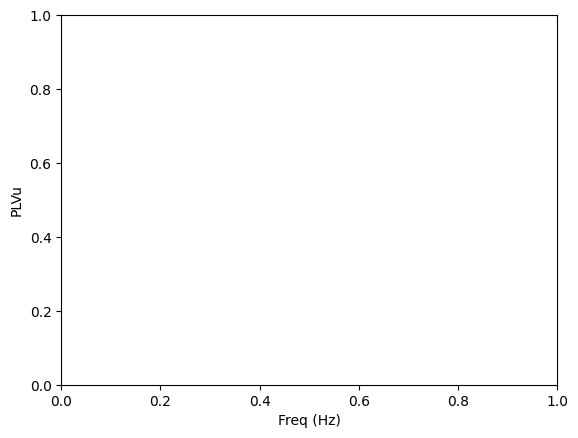

In [263]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert, find_peaks

def piecewise_constant_white_noise(t, Tdur, D, seed=None):
    if seed is not None:
        np.random.seed(seed)
    eta = np.random.randn(len(t))
    Ieta = np.zeros(len(t))
    for i in range(len(t)):
        Ieta[i] = eta[int(t[i] / Tdur)]
    return np.sqrt(D) * Ieta

def compute_plvu(phases):
    N = len(phases)
    if N < 2:
        return 0
    R = np.abs(np.sum(np.exp(1j * phases)))/N
    plvu = (N * R**2 - 1) / (N - 1)
    return max(plvu, 0)  # Ensure non-negative

dt = 0.1
t = np.arange(0, 1000, dt)
N_neurons = 10
burst_threshold = 20

freqs = np.arange(10, 11)

PLVu_theta_burst = []
PLVu_theta_single = []
PLVu_gamma_burst = []
PLVu_gamma_single = []

plvu_spike_accum = []
plvu_burst_accum = []

for freq in freqs:
    plvu_theta_burst_accum = []
    plvu_theta_single_accum = []
    plvu_gamma_burst_accum = []
    plvu_gamma_single_accum = []

    plvu_burst = []
    plvu_spike = []



    for neuron in range(N_neurons):
        noise = piecewise_constant_white_noise(t, 0.1, 10, seed=neuron)
                
        threshold = -55

        t = np.arange(0,1000,dt)

        N = len(t)
        Gnap = 0.1
        Gk = 8
        dt = 0.1
        Gl= 0.1
        El = -58
        Gm = 1
        Gna =55
        Gh = 3
        Eh = - 32.9
      
        Cm=1
        Ena = 55
        Ek = -90
        Ga=0#1.4
        Gca =0#.1
        Gc=0#10
        Gsahp=0#5
        Eca=120
        Eh=-32.9
        Gl =0.1
        Gl2 = 0.1

        Is = 1.25
        Id = 1.25
        Gsd =.2
        Gds=.2
        #Gnd= 0.2
        tstep = dt
        D = 1
        Tdur = 1

        noise = piecewise_constant_white_noise(t, Tdur, D)
        #numerical solution

        Vs = np.zeros(len(t))
        Vd = np.zeros(len(t))
        Vn = np.zeros(len(t))
        h = np.zeros(len(t))
        n = np.zeros(len(t))
        q = np.zeros(len(t))
        mM = np.zeros(len(t))
        hH = np.zeros(len(t))
        mM2 = np.zeros(len(t))
        hH2 = np.zeros(len(t))
        r = np.zeros(len(t))
        Z = np.zeros(len(t))
        B = np.zeros(len(t))
        H = np.zeros(len(t))
        C = np.zeros(len(t))
        Q = np.zeros(len(t))
        Ca_acum = np.zeros(len(t))
        Ca_acum[0] = 0.0001


        Dh = np.zeros(len(t))
        Dn = np.zeros(len(t))
        Dr = np.zeros(len(t))
        DZ = np.zeros(len(t))
        DB = np.zeros(len(t))

        DC = np.zeros(len(t))
        DQ = np.zeros(len(t))
        DCa_acum = np.zeros(len(t))
        DCa_acum[0] = 0.0001


        Vs[0] = El
        Vd[0] = El

        I_theta = np.array([zap_input(i, freq, dt) for i in range(len(t))])+noise

        for j in range(len(t) - 1):
            ###Complex Bursting Model
            k1vs = (-Gl*(Vs[j]-El)-Gna*(minf(Vs[j])**3)*h[j]*(Vs[j]-Ena)-Gnap*pinf(Vs[j])*(Vs[j]-Ena)
            -Gk*(n[j]**4)*(Vs[j]-Ek)-Ga*(Ainf(Vs[j])**3)*B[j]*(Vs[j]-Ek)-Gm*Z[j]*(Vs[j]-Ek)- Gca*(r[j]**2)*(Vs[j]-Eca)
            -Gc*dinf(Ca_acum[j])*C[j]*(Vs[j]-Ek)-Gsahp*Q[j]*(Vs[j]-Ek)-Gsd*(Vs[j]-Vd[j]))/Cm

            k1vd = (-Gl2*(Vd[j]-El)-Gh*H[j]*(Vd[j]-Eh)-Gds*(Vd[j]-Vs[j])+I_theta[j])/Cm

            #more compartments if needed (not sure yet)
            # k1vd = (-Gl2*(Vd[j]-El)-Ga*(Ainf(Vd[j])**3)*DB[j]*(Vd[j]-Ek)- Gca*(Dr[j]**2)*(Vd[j]-Eca)
            # -Gc*dinf(DCa_acum[j])*DC[j]*(Vd[j]-Ek)-Gnap*pinf(Vd[j])*(Vd[j]-Ena)-Gsahp*DQ[j]*(Vd[j]-Ek) -Gh*H[j]*(Vd[j]-Eh)-Gds*(Vd[j]-Vs[j]))/Cm;


            k1h = (hinf(Vs[j])-h[j])/tauh(Vs[j]);
            k1n = (ninf(Vs[j])-n[j])/taun(Vs[j]);
            k1r = (rinf(Vs[j])-r[j])/1;
            k1Z = (Zinf(Vs[j])-Z[j])/75;
            k1B = (Binf(Vs[j])-B[j])/15;
            k1H = (Hinf(Vd[j])-H[j])/tauH(Vd[j])
            k1C = (cinf(Vs[j])-C[j])/2
            kCa_acum = -0.13*(Gca*(r[j]**2)*(Vs[j]-Eca))-Ca_acum[j]/13
            k1Q = (Qinf(Ca_acum[j])-Q[j])/450


            
            dk1h = (hinf(Vd[j])-Dh[j])/tauh(Vd[j]);
            dk1n = (ninf(Vd[j])-Dn[j])/taun(Vd[j]);
            dk1r = (rinf(Vd[j])-Dr[j])/1;
            dk1Z = (Zinf(Vd[j])-DZ[j])/75;
            dk1B = (Binf(Vd[j])-DB[j])/15;
            dk1H = (Hinf(Vd[j])-H[j])/tauH(Vd[j])
            dk1C = (cinf(Vd[j])-DC[j])/2
            dkCa_acum = -0.13*(Gca*(Dr[j]**2)*(Vd[j]-Eca))-DCa_acum[j]/13
            dk1Q = (Qinf(DCa_acum[j])-DQ[j])/450

            avs = Vs[j]+k1vs*tstep;
            avd = Vd[j]+k1vd*tstep;
            ah = h[j]+k1h*tstep;
            an = n[j]+k1n*tstep;
            ar = r[j]+k1r*tstep;
            aZ = Z[j]+k1Z*tstep;
            aB = B[j]+k1B*tstep;
            aH = H[j]+k1H*tstep;
            aC = C[j]+k1C*tstep;
            aQ = Q[j]+k1Q*tstep;
            aCa = Ca_acum[j]+kCa_acum*tstep

            dah = Dh[j]+dk1h*tstep;
            dan = Dn[j]+dk1n*tstep;
            dar = Dr[j]+dk1r*tstep;
            daZ = DZ[j]+dk1Z*tstep;
            daB = DB[j]+dk1B*tstep;
            daC = DC[j]+dk1C*tstep;
            daQ = DQ[j]+dk1Q*tstep;
            daCa = DCa_acum[j]+dkCa_acum*tstep

            ###Complex Bursting Model
            k2vs = (-Gl*(avs-El)-Gna*(minf(avs)**3)*ah*(avs-Ena)-Gnap*pinf(avs)*(avs-Ena)
            -Gk*(an**4)*(avs-Ek)-Gm*aZ*(avs-Ek)-Ga*(Ainf(avs)**3)*aB*(avs-Ek)- Gca*(ar**2)*(avs-Eca)
            -Gc*dinf(aCa)*aC*(avs-Ek)-Gsahp*aQ*(avs-Ek)-Gsd*(avs-avd))/Cm

            k2vd = (-Gl2*(avd-El)-Gh*aH*(avd-Eh)-Gds*(avd-avs)+I_theta[j])/Cm

            #More compartments added if needed (not sure yet)
            # k2vd = (-Gl2*(avd-El)-Gh*aH*(avd-Eh)-Gds*(avd-avs)-Gnap*pinf(avd)*(avd-Ena)-Ga*(Ainf(avd)**3)*daB*(avd-Ek)- Gca*(dar**2)*(avd-Eca)
            # -Gc*dinf(daCa)*daC*(avd-Ek)-Gsahp*daQ*(avd-Ek))/Cm;

            k2h = (hinf(avs)-ah)/tauh(avs)
            k2n = (ninf(avs)-an)/taun(avs)
            k2r = (rinf(avs)-ar)/1
            k2Z = (Zinf(avs)-aZ)/75;
            k2B = (Binf(avs)-aB)/15;
            k2H = (Hinf(avd)-aH)/tauH(avd)
            k2C = (cinf(avs)-aC)/2;
            kCa_acum2 = -0.13*(Gca*(ar**2)*(avs-Eca))-aCa/13
            k2Q = (Qinf(aCa)-aQ)/450;


            dk2h = (hinf(avd)-dah)/tauh(avd)
            dk2n = (ninf(avd)-dan)/taun(avd)
            dk2r = (rinf(avd)-dar)/1
            dk2Z = (Zinf(avd)-daZ)/75;
            dk2B = (Binf(avd)-daB)/15;
            dk2C = (cinf(avd)-daC)/2;
            dkCa_acum2 = -0.13*(Gca*(dar**2)*(avd-Eca))-daCa/13
            dk2Q = (Qinf(daCa)-daQ)/450;

            Vs[j+1] = Vs[j]+(k1vs+k2vs)*tstep/2
            Vd[j+1] = Vd[j]+(k1vd+k2vd)*tstep/2
            h[j+1] = h[j]+(k1h+k2h)*tstep/2
            n[j+1] = n[j]+(k1n+k2n)*tstep/2
            r[j+1] = r[j]+(k1r+k2r)*tstep/2
            Z[j+1] = Z[j]+(k1Z+k2Z)*tstep/2
            B[j+1] = B[j]+(k1B+k2B)*tstep/2
            H[j+1] = H[j]+(k1H+k2H)*tstep/2
            C[j+1] = C[j]+(k1C+k2C)*tstep/2
            Q[j+1] = Q[j]+(k1Q+k2Q)*tstep/2
            Ca_acum[j+1] = Ca_acum[j]+(kCa_acum+kCa_acum2)*tstep/2


            Dh[j+1] = Dh[j]+(dk1h+dk2h)*tstep/2
            Dn[j+1] = Dn[j]+(dk1n+dk2n)*tstep/2
            Dr[j+1] = Dr[j]+(dk1r+dk2r)*tstep/2
            DZ[j+1] = DZ[j]+(dk1Z+dk2Z)*tstep/2
            DB[j+1] = DB[j]+(dk1B+dk2B)*tstep/2
            H[j+1] = H[j]+(k1H+k2H)*tstep/2
            DC[j+1] = DC[j]+(dk1C+dk2C)*tstep/2
            DQ[j+1] = DQ[j]+(dk1Q+dk2Q)*tstep/2
            DCa_acum[j+1] = DCa_acum[j]+(dkCa_acum+dkCa_acum2)*tstep/2

            # if Vs[j] > threshold:
            #         Vs[j] = 20 
            #         Vs[j+1] = -70
        

        # peaks, _ = find_peaks(Vs, height=0)
        # spike_times = t[peaks]
        # isi = np.diff(spike_times)

        # used_indices = set()
        # i = 0
        # while i < len(isi):
        #     if isi[i] < burst_threshold:
        #         used_indices.add(i)
        #         used_indices.add(i + 1)
        #         while i + 1 < len(isi) and isi[i + 1] < burst_threshold:
        #             i += 1
        #             used_indices.add(i + 1)
        #     i += 1

        # burst_spikes = []
        # single_spikes = []
        # for idx, spike_time in enumerate(spike_times):
        #     if idx in used_indices:
        #         burst_spikes.append(spike_time)
        #     else:
        #         single_spikes.append(spike_time)

        # Spike detection
        peaks, _ = find_peaks(Vs, height=0)
        spike_times = t[peaks]
        isi = np.diff(spike_times)

        # Burst criteria
        min_spikes_in_burst = 2
        burst_isi_max = 20      # ms
        burst_end_gap = 20      # ms

        # Containers
        burst_spikes = []
        single_spikes = []
        all_bursts = []

        # Burst detection loop
        current_burst = [spike_times[0]] if len(spike_times) > 0 else []

        for i in range(1, len(spike_times)):
            interval = spike_times[i] - spike_times[i - 1]

            if interval <= burst_isi_max:
                current_burst.append(spike_times[i])
            else:
                # Check for valid burst
                if len(current_burst) >= min_spikes_in_burst:
                    # Only end burst if there's a 30ms gap after it
                    if interval >= burst_end_gap:
                        all_bursts.append(current_burst)
                        burst_spikes.extend(current_burst)
                    else:
                        # Didn't meet end-gap criteria, treat all as singles
                        single_spikes.extend(current_burst)
                else:
                    single_spikes.extend(current_burst)
                
                current_burst = [spike_times[i]]

        # Check last burst at end
        if len(current_burst) >= min_spikes_in_burst:
            all_bursts.append(current_burst)
            burst_spikes.extend(current_burst)
        else:
            single_spikes.extend(current_burst)

        # Print summaries
        print(f"[{freq} Hz] Total spikes: {len(spike_times)}")
        print(f"[{freq} Hz] Total bursts detected: {len(all_bursts)}")
        print(f"[{freq} Hz] Spikes in bursts: {len(burst_spikes)}")
        print(f"[{freq} Hz] Single spikes: {len(single_spikes)}")

        analytic_signal = hilbert(I_theta-noise)
        inst_phase = np.angle(analytic_signal)
        
        # for sb in all_bursts:
        #     first_spike_in_sb = sb[0]

        #     print(f"first spike in sb {first_spike_in_sb}")

        burst_peaks = [i for i in peaks if t[i] in burst_spikes]
        single_peaks = [i for i in peaks if t[i] in single_spikes]

        if len(spike_times) > 10:
            burst_phases = inst_phase[burst_peaks]
            plvu_burst.append(compute_plvu(burst_phases))
            plvu_burst_accum.append(compute_plvu(burst_phases))
            print(f'PLVu Burst {plvu_burst} @ freq {freq} Hz')
        
            single_phases = inst_phase[single_peaks]
            plvu_spike.append(compute_plvu(single_phases))
            plvu_spike_accum.append(compute_plvu(single_phases))
            print(f'PLVu Spike {plvu_spike} @ freq {freq} Hz')

        else:
            plvu_spike.append(0)
            plvu_spike_accum.append(0)
            print(f'PLVu Spike {plvu_spike} @ freq {freq} Hz')

            plvu_burst.append(0)
            plvu_burst_accum.append(0)
            print(f'PLVu Burst {plvu_burst} @ freq {freq} Hz')


   
        y_burst_spikes = np.zeros_like(burst_spikes)+30


        plt.figure(figsize=(50,20))
        plt.plot(t,Vs,color = "blue")
        plt.plot(t,I_theta,color = "green")
        plt.plot(t,Vd,color = "mediumspringgreen")
        plt.scatter(burst_spikes,y_burst_spikes, marker='^', color='red', label='Triangles')
        plt.show()

        
        #plvu_theta_burst_accum.append(compute_plvu(burst_phases))
        #plvu_theta_single_accum.append(compute_plvu(single_phases))

        # fs = 1000/dt
        # gamma_freq = 40
        # analytic_signal_gamma = hilbert(np.sin(2 * np.pi * gamma_freq * t / 1000))
        # inst_phase_gamma = np.angle(analytic_signal_gamma)

        # burst_phases_gamma = inst_phase_gamma[burst_peaks]
        # single_phases_gamma = inst_phase_gamma[single_peaks]

        # plvu_gamma_burst_accum.append(compute_plvu(burst_phases_gamma))
        # plvu_gamma_single_accum.append(compute_plvu(single_phases_gamma))

    # PLVu_theta_burst.append(np.mean(plvu_theta_burst_accum))
    # PLVu_theta_single.append(np.mean(plvu_theta_single_accum))
    # PLVu_gamma_burst.append(np.mean(plvu_gamma_burst_accum))
    # PLVu_gamma_single.append(np.mean(plvu_gamma_single_accum))

# fig, axs = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
# axs[0].plot(freqs, PLVu_theta_burst, label='Burst')
# axs[0].plot(freqs, PLVu_theta_single, label='Single')
# axs[0].set_title('Theta Band PLVu (6-10 Hz approx)')
# axs[0].set_ylabel('PLVu')
# axs[0].legend()
# axs[0].grid(True)

# axs[1].plot(freqs, PLVu_gamma_burst, label='Burst')
# axs[1].plot(freqs, PLVu_gamma_single, label='Single')
# axs[1].set_title('Gamma Band PLVu (~40 Hz reference)')
# axs[1].set_xlabel('Input Frequency (Hz)')
# axs[1].set_ylabel('PLVu')
# axs[1].legend()
# axs[1].grid(True)

# plt.tight_layout()
# plt.show()
plt.ylabel("PLVu")
plt.xlabel("Freq (Hz)")
plt.plot(freqs,plvu_spike_accum,color = 'blue',label = "single spike")
plt.plot(freqs,plvu_burst_accum, color = 'red', label = "spike burst")
plt.legend(loc = "upper right")
plt.grid()
plt.show()

plt.figure(figsize=(10, 5))
plt.semilogx(freqs, plvu_spike_accum, color='blue', label="Single Spikes")
plt.semilogx(freqs, plvu_burst_accum, color='red', label="Burst Spikes")
plt.xlabel("Input Frequency (Hz, log scale)")
plt.ylabel("PLVu")
plt.title("Phase-Locking Value (PLVu) vs Frequency")
plt.grid(True, which='both', linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()
